# Carga de la información

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns #graficar puntos faltantes
import matplotlib.pyplot as plt 
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_excel(r"Pronosticos_.xlsx",sheet_name="ConFecha")
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 78889 entries, 0 to 78888
Data columns (total 4 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   semana            78889 non-null  object 
 1   Codmat            78889 non-null  object 
 2   cant              78889 non-null  float64
 3   semanacalendario  78889 non-null  float64
dtypes: float64(2), object(2)
memory usage: 2.4+ MB


In [3]:
df.semanacalendario =df.semanacalendario.astype('str')
df.head()

,semana,Codmat,cant,semanacalendario
0,2020-03-02,NN13-1000497,1891.000,2020.1
1,2020-03-02,NN13-1000498,544.333,2020.1
2,2020-03-02,NN13-1000794,4370.000,2020.1
3,2020-03-02,NN13-1000814,10.000,2020.1
4,2020-03-02,NN13-1000820,489.500,2020.1


Corregimos la semana calendario y agregamos el centro y el material

In [4]:
df.semanacalendario = df.semanacalendario.apply(\
    lambda x: x + '0' if len(x.split('.')[-1]) == 1 else x)
df['centro']= df.Codmat.str.split('-').str[0]
df['material']= df.Codmat.str.split('-').str[1]


In [5]:
df.head()

,semana,Codmat,cant,semanacalendario,centro,material
0,2020-03-02,NN13-1000497,1891.000,2020.10,NN13,1000497
1,2020-03-02,NN13-1000498,544.333,2020.10,NN13,1000498
2,2020-03-02,NN13-1000794,4370.000,2020.10,NN13,1000794
3,2020-03-02,NN13-1000814,10.000,2020.10,NN13,1000814
4,2020-03-02,NN13-1000820,489.500,2020.10,NN13,1000820


In [6]:
print("Cantidad de periodos: ", len(df.semanacalendario.unique()))
print("Cantidad de centros: ", len(df.centro.unique()))
print("Cantidad de materiales: ", len(df.material.unique()))
print("Cantidad de Combinaciones Centro - Material: ", len(df.Codmat.unique()))

Cantidad de periodos:  155
Cantidad de centros:  14
Cantidad de materiales:  77
Cantidad de Combinaciones Centro - Material:  694


Procedemos con Analisis Descriptivo, para entender el comportamiento de los datos.

In [7]:
df_caracteristicas= df.copy()

Se genera una copia del dataframe , a la cual se le agregaran caracteristicas como "Centro", "numeroSemana", "Semana Corregida", "material", "year" y "mes".

In [8]:
df_caracteristicas['centro']=df_caracteristicas['Codmat'].apply(lambda x: x.split('-')[0])
df_caracteristicas['numeroSemana']=df_caracteristicas['semanacalendario'].apply(lambda x: x.split('.')[1])
df_caracteristicas['Semana Corregida']=pd.to_datetime(df_caracteristicas['semana'])
df_caracteristicas['material']=df_caracteristicas['Codmat'].apply(lambda x: x.split('-')[1])
df_caracteristicas['year'] = df_caracteristicas['Semana Corregida'].dt.year
df_caracteristicas['mes'] = df_caracteristicas['Semana Corregida'].dt.month

In [9]:
df_caracteristicas

,semana,Codmat,cant,semanacalendario,centro,material,numeroSemana,Semana Corregida,year,mes
0,2020-03-02,NN13-1000497,1891.000,2020.10,NN13,1000497,10,2020-03-02,2020,3
1,2020-03-02,NN13-1000498,544.333,2020.10,NN13,1000498,10,2020-03-02,2020,3
2,2020-03-02,NN13-1000794,4370.000,2020.10,NN13,1000794,10,2020-03-02,2020,3
3,2020-03-02,NN13-1000814,10.000,2020.10,NN13,1000814,10,2020-03-02,2020,3
4,2020-03-02,NN13-1000820,489.500,2020.10,NN13,1000820,10,2020-03-02,2020,3
...,...,...,...,...,...,...,...,...,...,...
78884,2023-02-13,NNB8-1045787,420.600,2023.07,NNB8,1045787,07,2023-02-13,2023,2
78885,2023-02-13,NNB8-1047173,68.811,2023.07,NNB8,1047173,07,2023-02-13,2023,2
78886,2023-02-13,NNB8-1047642,132.000,2023.07,NNB8,1047642,07,2023-02-13,2023,2
78887,2023-02-13,NNB8-1053497,342.000,2023.07,NNB8,1053497,07,2023-02-13,2023,2


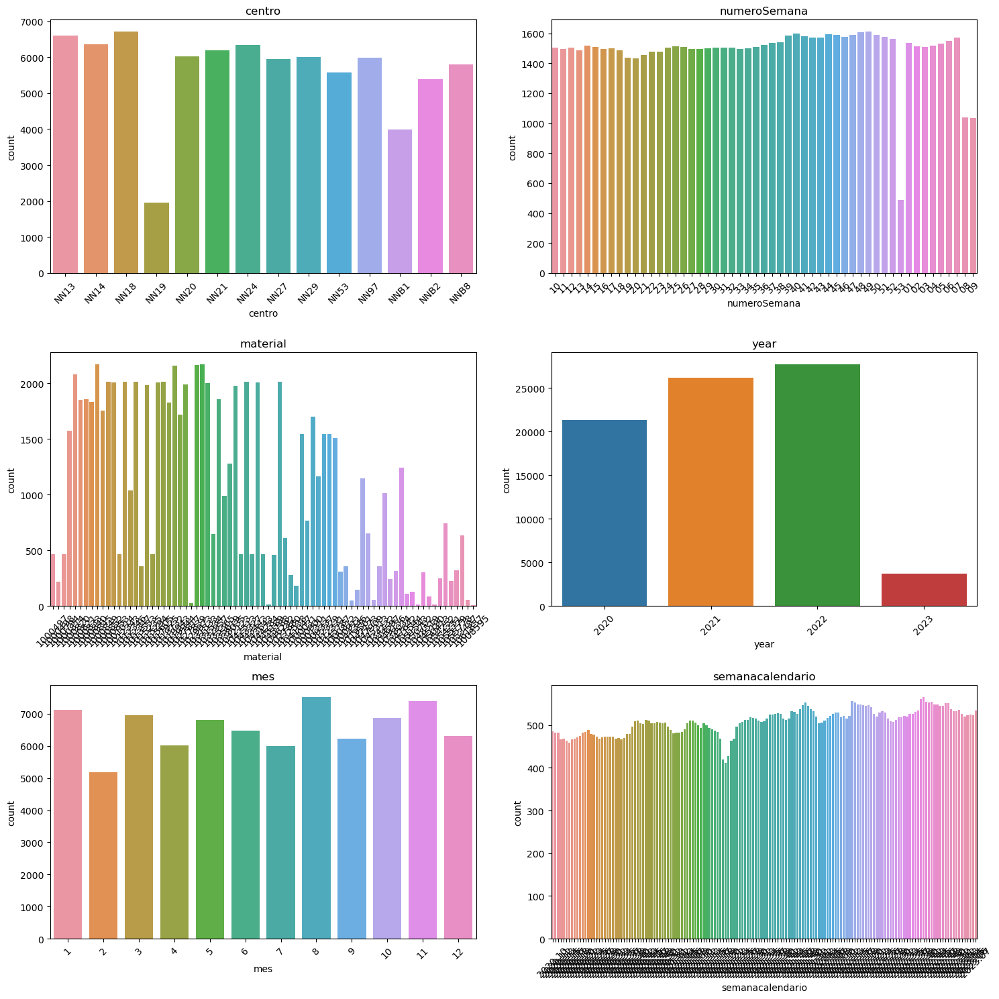

In [10]:
# fig, axs = plt.subplots(5, 1, figsize=(12, 16))
fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(15, 15))  # Dos columnas
axs = axs.flatten()  # Aplanar los ejes

for i, col in enumerate(['centro', 'numeroSemana', 'material', 'year','mes','semanacalendario']):
    sns.countplot(df_caracteristicas[col], ax=axs[i])
    axs[i].set_title(col)
    axs[i].tick_params(axis='x', labelrotation=45)
    
plt.tight_layout()
plt.show()

Se puede concluir lo siguiente:



Se analizara la completitud de las series. Para esto se hara el analisis tanto por Codmat como por material. Por centro no se investigara esta completitud, dado que que estariamos sumando las diferentes UMB de los materiales, y esto no tendria sentido para una decision final para acotar el problema

### Análsis por Material

In [11]:
df_material = df.groupby(['material', 'semana'])['cant'].sum().reset_index()
df_material

,material,semana,cant
0,1000031,2020-03-02,4553.695
1,1000031,2020-03-09,5492.006
2,1000031,2020-03-16,3870.255
3,1000031,2020-03-23,2284.952
4,1000031,2020-03-30,4020.223
...,...,...,...
9197,1061857,2023-01-16,448.000
9198,1061857,2023-01-23,1905.000
9199,1061857,2023-01-30,2937.000
9200,1061857,2023-02-06,1071.000


In [12]:
#se restructura la tabla para mirar la completitud de la serie
dfa_material=df_material.pivot(index='semana',columns="material",values='cant')
dfa_material

material,1000031,1000497,1000498,1000794,1000812,1000814,1000820,1000821,1000833,1000840,...,1050413,1050702,1051543,1051544,1053497,1054251,1054252,1055778,1055779,1061857
semana,,,,,,,,,,,,,,,,,,,,,
2020-03-02,4553.695,2347.000,548.333,5981.0,24.0,14861.851,7356.609,4503.815,3573.975,2498.545,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-03-09,5492.006,1822.000,1095.333,5012.0,24.0,20152.220,8500.055,6022.121,4475.146,3671.445,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-03-16,3870.255,3676.000,310.000,6980.0,54.0,17591.170,10662.832,2794.617,3850.982,2206.495,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-03-23,2284.952,3771.000,220.334,8112.0,55.0,12575.380,7451.010,962.701,4442.017,934.211,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-03-30,4020.223,3540.000,348.333,7770.0,40.0,14922.400,10086.938,1370.585,5302.665,1392.940,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-01-16,5917.500,2829.625,1180.000,1768.0,56.0,19041.167,13601.722,5955.619,5770.000,5275.000,...,NaN,NaN,477.00,NaN,26722.817,5542.000,2548.0,35.0,NaN,448.0
2023-01-23,5024.438,2208.000,319.667,1362.0,40.0,16314.000,12550.486,4863.438,4954.501,3554.500,...,NaN,NaN,600.00,NaN,17816.908,4244.000,1909.0,NaN,0.25,1905.0
2023-01-30,4574.348,3158.000,484.333,1944.0,40.0,17300.000,13762.514,4977.264,4293.500,2934.500,...,NaN,NaN,532.00,1.0,20436.179,5149.000,2528.0,NaN,NaN,2937.0


### EDA

Se procedera a realizar el analisas exploratorio del dataset

In [13]:
dfa_material.describe()

material,1000031,1000497,1000498,1000794,1000812,1000814,1000820,1000821,1000833,1000840,...,1050413,1050702,1051543,1051544,1053497,1054251,1054252,1055778,1055779,1061857
count,155.000000,155.000000,153.000000,155.000000,155.000000,155.000000,155.000000,155.000000,155.000000,153.000000,...,12.000000,12.000000,56.000000,75.000000,64.000000,83.000000,83.000000,31.000000,26.000000,22.000000
mean,4599.350084,2276.308084,588.019601,2551.757677,52.128394,9423.697710,11305.364200,4732.535135,4787.227639,3524.878641,...,1.977167,6.135417,291.075982,4.644667,19726.792406,4470.847108,1922.632289,5469.871742,1531.128538,1789.500000
std,1159.853337,463.818383,198.070347,1042.661689,19.122089,6440.584754,1856.312963,1618.255781,636.665763,930.152020,...,0.467961,1.418685,265.700396,3.820252,2738.231218,718.743486,636.029493,4276.877149,1704.353586,1233.459546
min,1660.490000,1489.608000,138.334000,1176.000000,9.000000,2490.437000,7183.280000,962.701000,3572.226000,934.211000,...,1.333000,3.500000,6.000000,1.000000,3937.000000,1955.858000,554.782000,1.000000,0.250000,275.000000
25%,3460.043500,1905.300500,471.332000,1955.500000,40.000000,4021.195500,9937.511000,3269.679000,4320.973000,2906.048000,...,1.567000,5.843750,43.004000,2.000000,19001.860500,4179.104500,1662.000000,1583.000000,246.187500,769.000000
50%,4849.459000,2226.000000,561.721000,2374.000000,50.000000,4891.054000,11392.500000,5269.500000,4701.500000,3658.445000,...,2.002500,6.562500,214.821000,4.243000,20052.043500,4464.263000,1969.000000,4076.000000,821.875000,1520.500000
75%,5536.347000,2607.000000,686.193000,2754.000000,60.515500,17110.297500,12491.687500,6016.272000,5159.844000,4127.578000,...,2.031000,7.250000,548.070000,5.520000,20768.679500,4918.715500,2397.500000,7935.000000,2120.062500,2932.500000
max,6927.294000,3771.000000,1180.000000,8112.000000,123.000000,20712.000000,17395.500000,8138.000000,6824.315000,5837.500000,...,3.071000,7.250000,717.402000,19.000000,26722.817000,6280.000000,3273.000000,13658.000000,5965.750000,4141.000000


Box plot

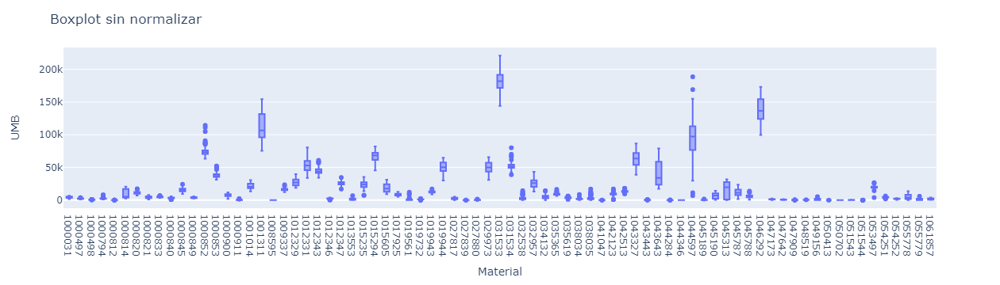

In [14]:
# Create the box plot
fig = px.box(dfa_material )

# Update the layout
fig.update_layout(title='Boxplot sin normalizar',xaxis_title='Material',yaxis_title='UMB')

# Display the plot
fig.show()

Se observa que hay grandes diferencias en la escala de valores de cada característica. Para mejorar la visualización de los datos, se aplica una normalización:

In [15]:
dfa_material_Normalizado = (dfa_material - dfa_material.min())/(dfa_material.max() - dfa_material.min())

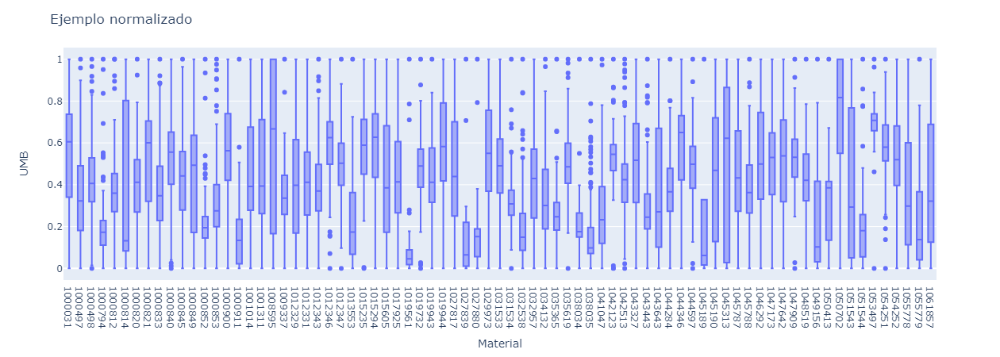

In [16]:

# Create the box plot
fig = px.box(dfa_material_Normalizado)

# Update the layout
fig.update_layout(title='Ejemplo normalizado',xaxis_title='Material',yaxis_title='UMB',height=450)

# Display the plot
fig.show()

Al normalizar la BD, encontramos que hay materiales que poseen gran cantidad de atípicos.La mayoria de los posibles atipicos se encuentran en la parte superior de los boxplot, es decir luego del percentil 75%.Se realizara un describe par entender algunos estadisticos de los datos. 

In [17]:
dfa_material_Normalizado.describe()

material,1000031,1000497,1000498,1000794,1000812,1000814,1000820,1000821,1000833,1000840,...,1050413,1050702,1051543,1051544,1053497,1054251,1054252,1055778,1055779,1061857
count,155.000000,155.000000,153.000000,155.000000,155.000000,155.000000,155.000000,155.000000,155.000000,153.000000,...,12.000000,12.000000,56.000000,75.000000,64.000000,83.000000,83.000000,31.000000,26.000000,22.000000
mean,0.557997,0.344833,0.431698,0.198350,0.378319,0.380498,0.403642,0.525391,0.373607,0.528353,...,0.370637,0.702778,0.400724,0.202481,0.692966,0.581616,0.503216,0.400445,0.256622,0.391749
std,0.220220,0.203305,0.190148,0.150326,0.167738,0.353460,0.181774,0.225531,0.195771,0.189700,...,0.269252,0.378316,0.373488,0.212236,0.120173,0.166216,0.233988,0.313164,0.285702,0.319053
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.341678,0.182210,0.319678,0.112385,0.271930,0.084008,0.269700,0.321517,0.230236,0.402146,...,0.134638,0.625000,0.052016,0.055556,0.661151,0.514147,0.407332,0.115838,0.041227,0.127781
50%,0.605485,0.322782,0.406452,0.172722,0.359649,0.131746,0.412175,0.600226,0.347246,0.555593,...,0.385213,0.816667,0.293534,0.180167,0.707240,0.580093,0.520274,0.298382,0.137729,0.322168
75%,0.735903,0.489785,0.525945,0.227509,0.451890,0.802338,0.519809,0.704301,0.488184,0.651270,...,0.401611,1.000000,0.761974,0.251111,0.738691,0.685190,0.677914,0.580947,0.355345,0.687403
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


Se puede apreciar incialmente que existen materiales que poseen datos faltantes.Más adelante se debe decidir la manera de imputar estos materiales o depurarlos de la BD.

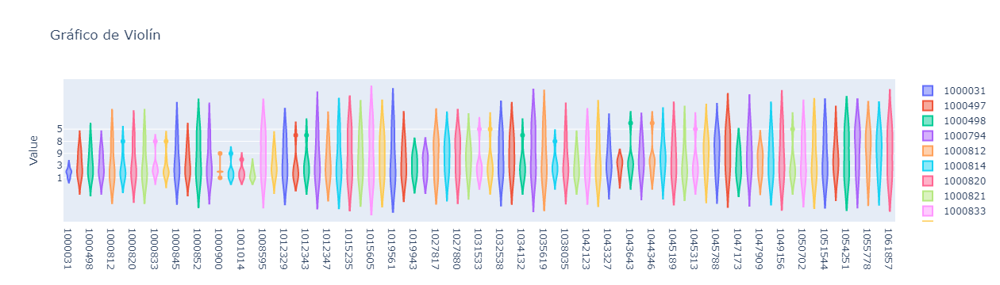

In [18]:
import plotly.graph_objs as go
import numpy as np

data = dfa_material_Normalizado

traces = []
for i, d in enumerate(data):
    trace = go.Violin(y=list(d), name=d)
    traces.append(trace)

fig = go.Figure(data=traces)

fig.update_layout(title='Gráfico de Violín',
                  yaxis_title='Value')

fig.show()


En la mayoria de los materiales se puede observar una simetria en la distribución de los datos, por lo que es un indicio de que el comportamiento de estos materiales es aproximadamente normal.

Por otro lado, hay materiales que presentan asimetrias en la densidad de su distribución, como es el caso de los siguientes materiales: ['1000031','1000820','1000833','1000840','1000900','1000911','1001014,'1001311','1012331','1031533','1031534','1034132','1038034','1044346','1043643','1045313','1050413']

Se procede a realizar el tratamiento de outliers. El análisis de outliers se refiere a la identificación y tratamiento de valores atípicos en un conjunto de datos, que pueden ser errores o valores extremos que afectan negativamente el análisis de los datos. Es importante realizar este análisis antes de imputar los valores faltantes, ya que los valores atípicos pueden afectar la distribución y las relaciones entre las variables y, por lo tanto, también pueden afectar el método de imputación.

## Rango intercuartil para detección de datos atípicos

In [19]:
from sklearn.neighbors import LocalOutlierFactor # Algoritmo LOF
from scipy.special import entr # Entropía de Shannon
from scipy.stats import multivariate_normal # Modelo de distribución gaussiana multivariable
from sklearn.covariance import EllipticEnvelope # Estimación de Covarianza
from scipy.stats import median_abs_deviation # MAD
from scipy.stats import iqr # Interquartile range

In [20]:
nombres =dfa_material_Normalizado.columns

El método de rango intercuartil es un método de detección de datos atípicos a partir de la diferencia entre el primer (25%) y el tercer cuartil (75%), el cual permite cubrir el 50% de los datos. 

$IQR = Q3 - Q1$

In [21]:
IQR = iqr(dfa_material_Normalizado, axis = 0, rng = (25, 75), interpolation = 'midpoint')

In [22]:
DC = IQR/2 # Ahora, calculamos la desviación cuartil, el cual es la mitad del IQR:

La desviación cuartil nos permite observar que región de los datos está por fuera del IQR (Se puede visualizar con el diagrama de cajas). Ahora, vamos a calcular los límites intercuatiles el cual es $Q1 - 1.5*IQR$ y $Q3 + 1.5*IQR$. El valor 1.5 permite establecer una distancia entre el cuartil Q1 y Q3 con respecto al extremo superior e inferior de una caja que representa los datos.

In [23]:
Q1 = np.percentile(dfa_material_Normalizado, 25, axis = 0, interpolation = 'midpoint')
Q3 = np.percentile(dfa_material_Normalizado, 75, axis = 0, interpolation = 'midpoint')

Min_Limite = Q1 - 1.5*IQR
Max_Limite = Q3 + 1.5*IQR



In [24]:
datos_atipicos = [[] for _ in range(dfa_material_Normalizado.shape[1])]
pos_atipicos = [[] for _ in range(dfa_material_Normalizado.shape[1])]

for i in range(dfa_material_Normalizado.shape[1]):
    for j in range(dfa_material_Normalizado.shape[0]):
        if dfa_material_Normalizado.iloc[j, i] < Min_Limite[i] or dfa_material_Normalizado.iloc[j, i] > Max_Limite[i]:
            datos_atipicos[i].append(dfa_material_Normalizado.iloc[j, i])
            pos_atipicos[i].append(j)

Numero_datos_atipicos = [len(datos_atipicos[i]) for i in range(len(datos_atipicos))]
reporte = pd.DataFrame(Numero_datos_atipicos, index=nombres, columns=['Número de Datos Atípicos'])
display(reporte) 

,Número de Datos Atípicos
material,
1000031,0
1000497,2
1000498,0
1000794,11
1000812,7
...,...
1054251,0
1054252,0
1055778,0


array([[<AxesSubplot:title={'center':'Número de Datos Atípicos'}>]],
      dtype=object)

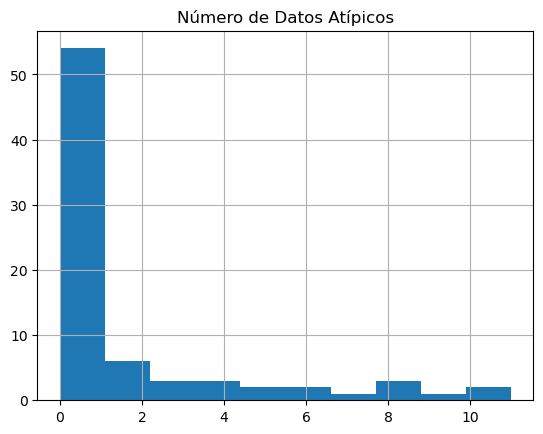

In [25]:
reporte.hist()

Se decide realizar tamponamiento superior e inferior, para no eliminar periodos de tiempo

In [26]:
Datos_taponados = dfa_material_Normalizado.copy()

cols = nombres
for i,col in enumerate(cols):
    Datos_taponados[col] = np.where(Datos_taponados[col] > Max_Limite[i], Max_Limite[i],
                                np.where(Datos_taponados[col] < Min_Limite[i], Min_Limite[i], Datos_taponados[col]))


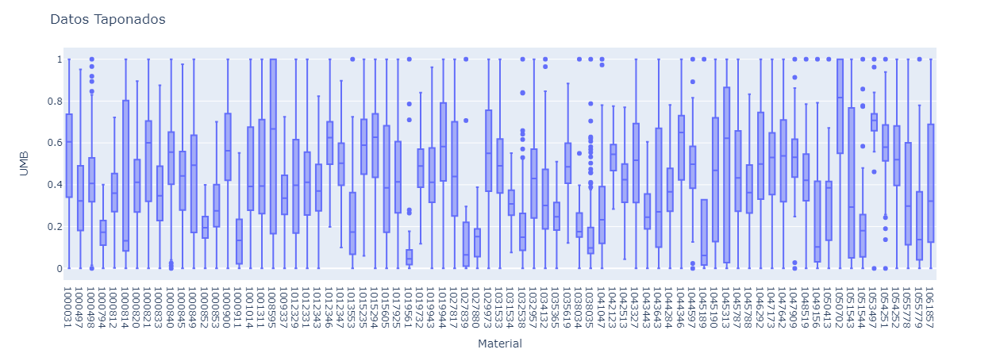

In [27]:
# Create the box plot
fig = px.box(Datos_taponados)

# Update the layout
fig.update_layout(title='Datos Taponados',xaxis_title='Material',yaxis_title='UMB',height=450)

# Display the plot
fig.show()

El algoritmo realizo el taponamiento de los materiales que no poseen nulos. Los materiales que cuenta con los datos de la serie imcompleta, no fueron afectados ya que sus limites minimos y maximos son nan. Estos se estudiaran luego de una posible depuración.

In [28]:
print("Límites inferiores material 2= ", Min_Limite[2])
print("Límites superiores material 2 = ", Max_Limite[2])
print("Límites inferiores material 72 = ", Min_Limite[72])
print("Límites superiores material 72 = ", Max_Limite[72])

Límites inferiores material 2=  nan
Límites superiores material 2 =  nan
Límites inferiores material 72 =  nan
Límites superiores material 72 =  nan


In [29]:
dfa_material_sinout=Datos_taponados.copy()

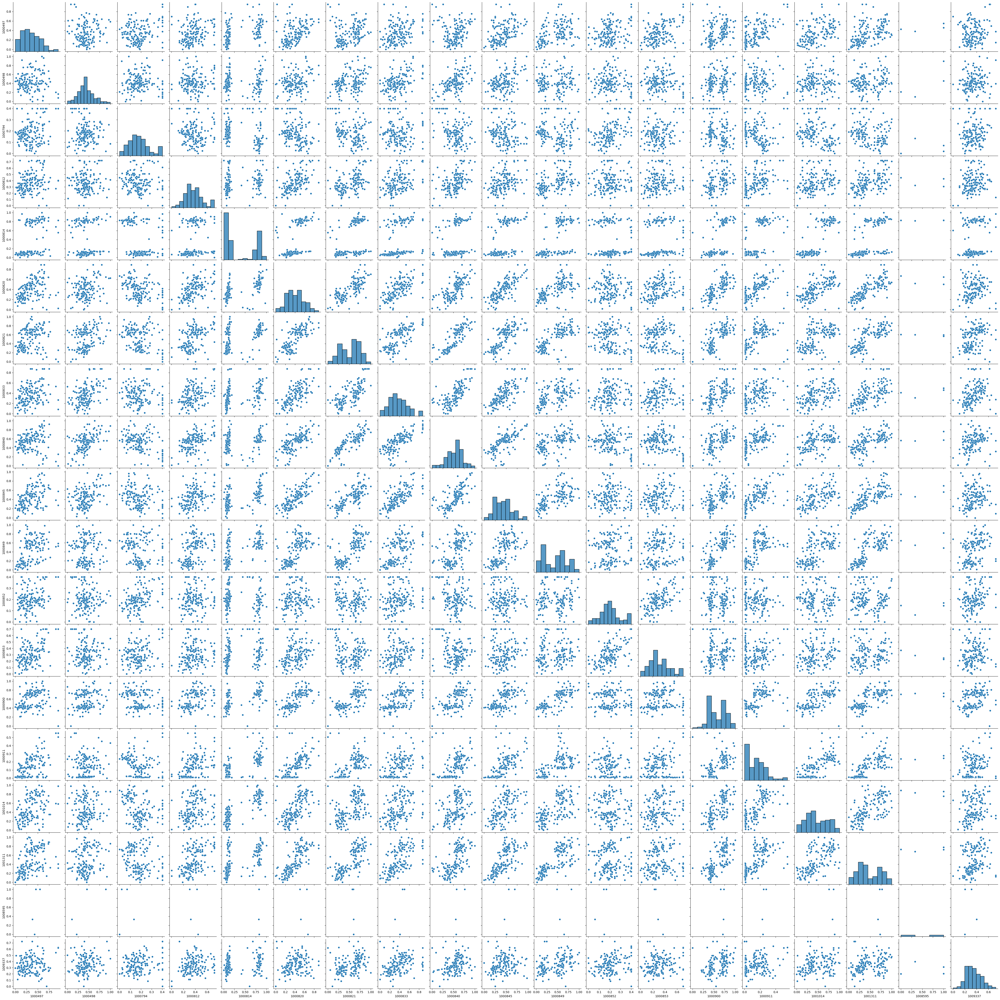

In [30]:
sns.pairplot(dfa_material_sinout.iloc[:,1:20])

En la matriz de dispersión, podemos evidenciar materiales que poseen una calidad de los datos bastante aceptable, seguramente porque se encuentran completos o al realizar la agregación de los datos por todos los centros, no afecto su distribución como tal.

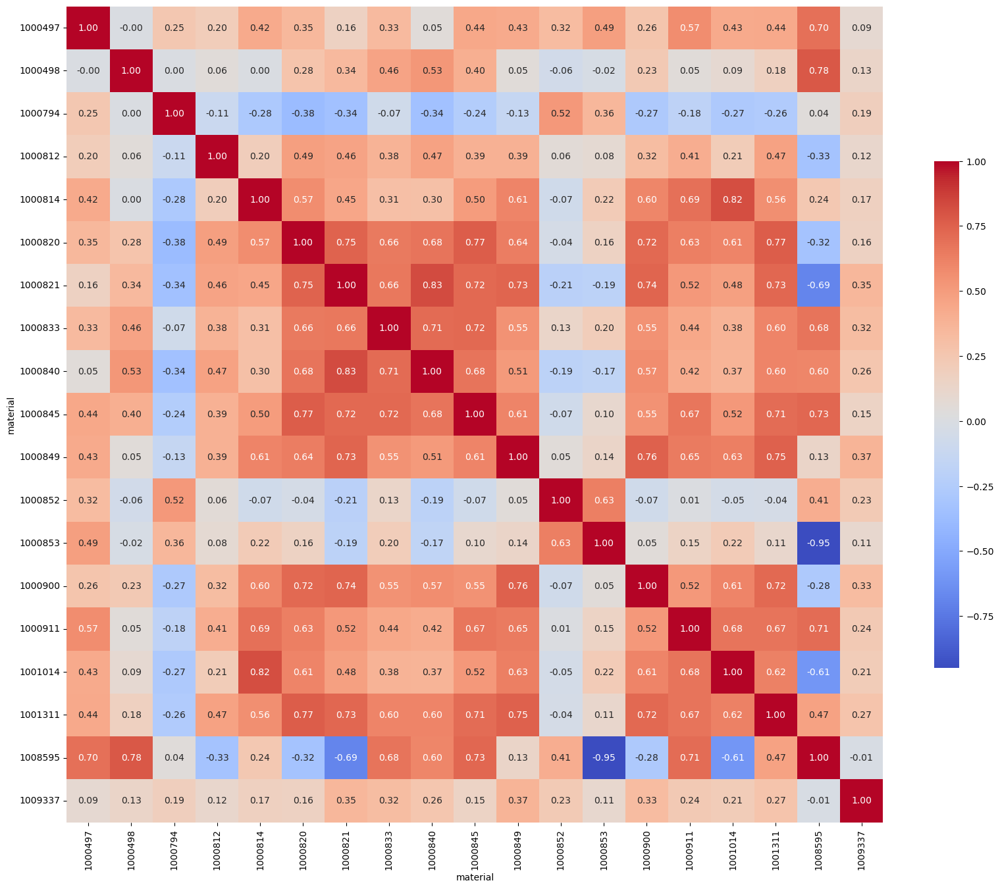

In [31]:
correlation=dfa_material_sinout.iloc[:,1:20].corr(method='pearson')
g=sns.heatmap(correlation,square=True,cbar_kws={"shrink": .5},annot=True,fmt='.2f',cmap="coolwarm")
g.figure.set_size_inches(20,20)

plt.show()

Se analizaron los primeros 20 materiales, para entender inicialmente como se correlacionan estos materiales entre si a través de las semanas. Se evidencian correlaciones fuertes entre varios productos, lo que podria dar señales al posterior clustering.

Las relaciones negativas fuertes se presentan con los materales que poseen datos faltantes.

<AxesSubplot:xlabel='material', ylabel='semana'>

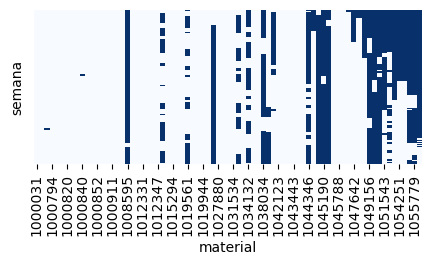

In [32]:
# identificar faltaltes en las series (azul oscuro zonas con datos faltantes)
plt.subplots(figsize=(5, 2))
sns.heatmap(dfa_material_sinout.isnull(), yticklabels=False, cbar=False, cmap = "Blues")

In [33]:
nulos_materiales =pd.DataFrame(dfa_material_sinout.isnull().sum()).reset_index()
nulos_materiales = nulos_materiales[nulos_materiales[0] >0]
nulos_materiales["Porcentaje/Periodos"] = nulos_materiales[0]/len(df.semanacalendario.unique())*100
nulos_materiales = nulos_materiales.rename(columns={0:'cantidadPeriodosVacios'})
nulos_materiales= nulos_materiales.sort_values(by='Porcentaje/Periodos',ascending=False)
nulos_materiales

,material,cantidadPeriodosVacios,Porcentaje/Periodos
18,1008595,151,97.419355
56,1045189,150,96.774194
58,1045313,148,95.483871
57,1045190,147,94.838710
68,1050702,143,92.258065
67,1050413,143,92.258065
35,1027839,139,89.677419
76,1061857,133,85.806452
66,1049156,130,83.870968
75,1055779,129,83.225806


<AxesSubplot:>

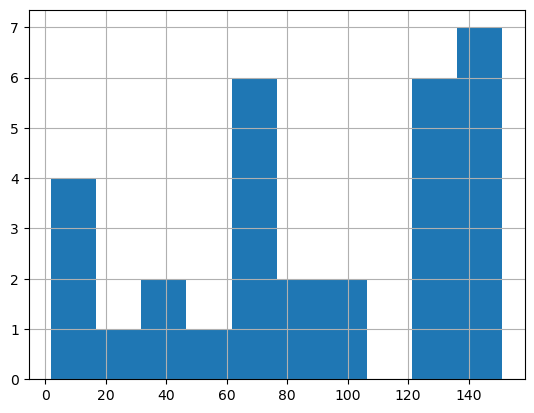

In [34]:
nulos_materiales.cantidadPeriodosVacios.hist()

In [35]:
print("Cantiad de materiales que posean al menos un periodo vacio: ", len(nulos_materiales.material.unique()))
print("Porcentaje de materiales que posean al menos un periodo vacio: ",\
                  len(nulos_materiales.material.unique())/len(df.material.unique())*100)
print("Cantidad de materiales que posean mas del 30% de los periodos vacios: ",\
                  len(nulos_materiales[nulos_materiales["Porcentaje/Periodos"]>30].material.unique()))
print("Porcentaje de materiales que posean mas del 30% de los periodos vacios: ",\
                  len(nulos_materiales[nulos_materiales["Porcentaje/Periodos"]>30].material.unique())/len(df.material.unique())*100)


Cantiad de materiales que posean al menos un periodo vacio:  31
Porcentaje de materiales que posean al menos un periodo vacio:  40.25974025974026
Cantidad de materiales que posean mas del 30% de los periodos vacios:  24
Porcentaje de materiales que posean mas del 30% de los periodos vacios:  31.16883116883117


In [36]:
nulos_materiales[nulos_materiales["Porcentaje/Periodos"]>30].material.unique()

array(['1008595', '1045189', '1045313', '1045190', '1050702', '1050413',
       '1027839', '1061857', '1049156', '1055779', '1038034', '1044346',
       '1055778', '1051543', '1034132', '1053497', '1051544', '1032538',
       '1013553', '1054252', '1054251', '1019561', '1041047', '1048519'],
      dtype=object)

Los materiales ['1008595', '1045189', '1045313', '1045190', '1050702', '1050413',
       '1027839', '1061857', '1049156', '1055779', '1038034', '1044346',
       '1055778', '1051543', '1034132', '1053497', '1051544', '1032538',
       '1013553', '1054252', '1054251', '1019561', '1041047', '1048519'] poseen mas del 30% de los periodos con datos nulos

Se hara el mismo analisis para la combinación CodMat

In [37]:
#Restructura la tabla 
dfs=df.pivot(index='semana',columns="Codmat",values='cant')
dfs

Codmat,NN13-1000497,NN13-1000498,NN13-1000794,NN13-1000814,NN13-1000820,NN13-1000821,NN13-1000833,NN13-1000840,NN13-1000845,NN13-1000849,...,NNB8-1045787,NNB8-1046292,NNB8-1047173,NNB8-1047642,NNB8-1047909,NNB8-1049156,NNB8-1053497,NNB8-1054251,NNB8-1055778,NNB8-1055779
semana,,,,,,,,,,,,,,,,,,,,,
2020-03-02,1891.0,544.333,4370.0,10.0,489.5,56.0,976.500,56.0,1842.0,433.000,...,126.0,1301.854,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-03-09,1393.0,1095.333,3421.0,20.0,782.5,70.0,1177.000,150.0,2863.0,371.000,...,203.0,1334.426,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-03-16,2639.0,305.000,4253.0,31.0,354.0,66.0,515.500,45.5,1543.0,796.000,...,159.0,1880.568,13.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-03-23,2957.0,220.334,6052.0,24.0,564.0,80.0,950.000,58.0,2294.0,723.000,...,1.0,1829.283,11.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-03-30,2680.0,347.333,4788.0,9.0,462.5,44.0,907.000,45.5,1805.0,589.000,...,107.0,1541.282,7.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-01-16,1869.0,1180.000,1134.0,NaN,667.5,68.0,1584.500,81.0,4589.0,562.000,...,631.0,1712.995,144.871,161.0,NaN,NaN,534.909,30.0,NaN,NaN
2023-01-23,1573.0,319.667,866.0,30.0,636.5,177.0,1270.438,118.0,2134.0,461.757,...,331.0,1476.067,121.012,72.0,NaN,NaN,389.909,39.0,NaN,NaN
2023-01-30,2155.0,484.333,1074.0,NaN,647.0,36.0,891.000,87.0,4432.0,508.000,...,452.9,1554.283,88.184,121.0,NaN,NaN,460.909,16.0,NaN,NaN


<AxesSubplot:xlabel='Codmat', ylabel='semana'>

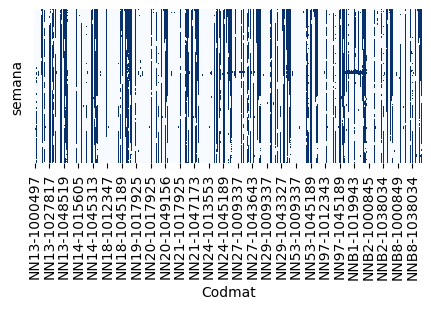

In [38]:
# identificar faltaltes en las series (azul oscuro zonas con datos faltantes)
plt.subplots(figsize=(5, 2))
sns.heatmap(dfs.isnull(), yticklabels=False, cbar=False, cmap = "Blues")

In [39]:
nulos_codmateriales =pd.DataFrame(dfs.isnull().sum()).reset_index()
nulos_codmateriales = nulos_codmateriales[nulos_codmateriales[0] >0]
nulos_codmateriales["Porcentaje/Periodos"] = nulos_codmateriales[0]/len(df.semanacalendario.unique())*100
nulos_codmateriales = nulos_codmateriales.rename(columns={0:'cantidadPeriodosVacios'})
nulos_codmateriales= nulos_codmateriales.sort_values(by='Porcentaje/Periodos',ascending=False)
nulos_codmateriales

,Codmat,cantidadPeriodosVacios,Porcentaje/Periodos
338,NN24-1045189,154,99.354839
281,NN21-1045189,154,99.354839
494,NN53-1045189,154,99.354839
546,NN97-1045189,154,99.354839
453,NN29-1051543,154,99.354839
...,...,...,...
255,NN21-1012346,1,0.645161
188,NN20-1000031,1,0.645161
80,NN14-1019732,1,0.645161
459,NN53-1000031,1,0.645161


<AxesSubplot:>

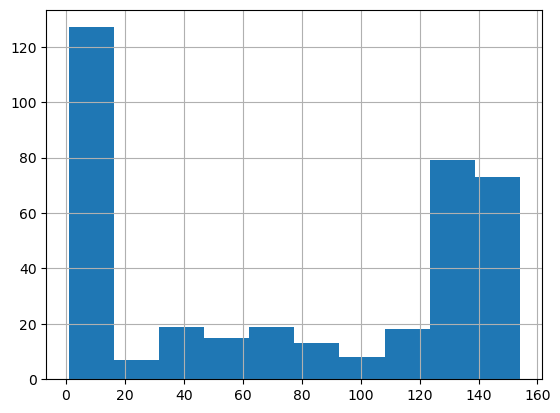

In [40]:
nulos_codmateriales.cantidadPeriodosVacios.hist()

In [41]:
print("Cantiad de combinaciones que posean al menos un periodo vacio: ", len(nulos_codmateriales.Codmat.unique()))
print("Porcentaje de combinaciones que posean al menos un periodo vacio: ",\
                  len(nulos_codmateriales.Codmat.unique())/len(df.Codmat.unique())*100)
print("Cantidad de combinaciones que posean mas del 30% de los periodos vacios: ",\
                  len(nulos_codmateriales[nulos_codmateriales["Porcentaje/Periodos"]>30].Codmat.unique()))
print("Porcentaje de combianciones que posean mas del 30% de los periodos vacios: ",\
                  len(nulos_codmateriales[nulos_codmateriales["Porcentaje/Periodos"]>30].Codmat.unique())/len(df.Codmat.unique())*100)

Cantiad de combinaciones que posean al menos un periodo vacio:  378
Porcentaje de combinaciones que posean al menos un periodo vacio:  54.46685878962536
Cantidad de combinaciones que posean mas del 30% de los periodos vacios:  225
Porcentaje de combianciones que posean mas del 30% de los periodos vacios:  32.42074927953891


In [42]:
nulos_codmateriales[nulos_codmateriales["Porcentaje/Periodos"]>30].Codmat.unique()

array(['NN24-1045189', 'NN21-1045189', 'NN53-1045189', 'NN97-1045189',
       'NN29-1051543', 'NN14-1045189', 'NN29-1015294', 'NN13-1045189',
       'NNB2-1044346', 'NNB8-1045313', 'NN27-1045313', 'NN14-1032538',
       'NN20-1045313', 'NN53-1045313', 'NNB1-1045190', 'NNB2-1045313',
       'NNB2-1019561', 'NNB2-1055779', 'NN13-1045313', 'NN29-1045189',
       'NN13-1008595', 'NN18-1045189', 'NN14-1045313', 'NN24-1045313',
       'NNB8-1019561', 'NNB8-1045190', 'NN21-1034132', 'NN29-1045313',
       'NN21-1045313', 'NN14-1045190', 'NNB2-1045190', 'NN97-1045313',
       'NN20-1045190', 'NN18-1045313', 'NN97-1045190', 'NNB1-1038035',
       'NN53-1045190', 'NN27-1045190', 'NN13-1045190', 'NN14-1013553',
       'NN21-1045190', 'NNB2-1049156', 'NN24-1045190', 'NN29-1045190',
       'NN18-1045190', 'NNB8-1013553', 'NN24-1027839', 'NNB8-1049156',
       'NN13-1027880', 'NN21-1051544', 'NNB1-1055779', 'NN13-1061857',
       'NN20-1019561', 'NN18-1061857', 'NN24-1032957', 'NN53-1019561',
      

Las combinaciones ['NN24-1045189', 'NN21-1045189', 'NN53-1045189', 'NN97-1045189',
       'NN29-1051543', 'NN14-1045189', 'NN29-1015294', 'NN13-1045189',
       'NNB2-1044346', 'NNB8-1045313', 'NN27-1045313', 'NN14-1032538',
       'NN20-1045313', 'NN53-1045313', 'NNB1-1045190', 'NNB2-1045313',
       'NNB2-1019561', 'NNB2-1055779', 'NN13-1045313', 'NN29-1045189',
       'NN13-1008595', 'NN18-1045189', 'NN14-1045313', 'NN24-1045313',
       'NNB8-1019561', 'NNB8-1045190', 'NN21-1034132', 'NN29-1045313',
       'NN21-1045313', 'NN14-1045190', 'NNB2-1045190', 'NN97-1045313',
       'NN20-1045190', 'NN18-1045313', 'NN97-1045190', 'NNB1-1038035',
       'NN53-1045190', 'NN27-1045190', 'NN13-1045190', 'NN14-1013553',
       'NN21-1045190', 'NNB2-1049156', 'NN24-1045190', 'NN29-1045190',
       'NN18-1045190', 'NNB8-1013553', 'NN24-1027839', 'NNB8-1049156',
       'NN13-1027880', 'NN21-1051544', 'NNB1-1055779', 'NN13-1061857',
       'NN20-1019561', 'NN18-1061857', 'NN24-1032957', 'NN53-1019561',
       'NN18-1050413', 'NN18-1050702', 'NN21-1032957', 'NN24-1027880',
       'NN24-1032538', 'NN53-1032538', 'NNB1-1019944', 'NN13-1027839',
       'NN14-1027880', 'NN20-1027880', 'NNB8-1034132', 'NN21-1055779',
       'NNB8-1055779', 'NNB8-1047909', 'NN24-1061857', 'NNB8-1032538',
       'NNB1-1055778', 'NN53-1034132', 'NN13-1032538', 'NN27-1013553',
       'NN18-1051544', 'NN53-1013553', 'NN97-1032538', 'NNB1-1049156',
       'NNB2-1034132', 'NN53-1055779', 'NN21-1019561', 'NN29-1055779',
       'NN27-1047173', 'NNB8-1044346', 'NN21-1032538', 'NN21-1051543',
       'NN20-1013553', 'NN20-1049156', 'NN27-1049156', 'NN14-1055779',
       'NN27-1055779', 'NN29-1061857', 'NN14-1041047', 'NN13-1055779',
       'NN97-1055779', 'NN18-1049156', 'NN24-1049156', 'NN20-1055779',
       'NN21-1049156', 'NN13-1049156', 'NN19-1013553', 'NN14-1049156',
       'NN29-1049156', 'NN53-1049156', 'NN29-1032538', 'NN97-1049156',
       'NN18-1055779', 'NN29-1027880', 'NN97-1034132', 'NNB8-1055778',
       'NN97-1013553', 'NNB8-1038034', 'NN20-1032538', 'NN97-1055778',
       'NN27-1051543', 'NNB2-1055778', 'NN24-1055779', 'NNB2-1000840',
       'NNB2-1047909', 'NNB2-1038034', 'NN53-1055778', 'NN27-1019561',
       'NN20-1038034', 'NN20-1055778', 'NN97-1038034', 'NN18-1055778',
       'NN27-1055778', 'NN53-1038034', 'NN29-1038034', 'NN21-1055778',
       'NN14-1055778', 'NN21-1038034', 'NN29-1055778', 'NN18-1012346',
       'NN18-1047909', 'NN27-1038034', 'NN13-1055778', 'NN29-1013553',
       'NN18-1038034', 'NN18-1051543', 'NN14-1038034', 'NN24-1038034',
       'NNB2-1013553', 'NN27-1032538', 'NN18-1044346', 'NNB1-1047173',
       'NN24-1055778', 'NN14-1047173', 'NN13-1038034', 'NN18-1019561',
       'NN29-1034132', 'NN24-1047173', 'NN13-1047173', 'NN97-1047173',
       'NNB8-1009337', 'NN20-1034132', 'NN14-1034132', 'NN13-1034132',
       'NNB2-1032538', 'NN13-1013553', 'NN24-1013553', 'NN20-1051544',
       'NN24-1019561', 'NN27-1034132', 'NN27-1051544', 'NNB1-1000849',
       'NN18-1034132', 'NN21-1013553', 'NN24-1051543', 'NN24-1034132',
       'NNB2-1044597', 'NN29-1047173', 'NN14-1000498', 'NN53-1053497',
       'NN20-1053497', 'NN18-1013553', 'NNB8-1053497', 'NN18-1053497',
       'NN21-1053497', 'NNB2-1053497', 'NN24-1053497', 'NN29-1053497',
       'NN27-1053497', 'NNB1-1053497', 'NN21-1035619', 'NN18-1032538',
       'NNB1-1000820', 'NN24-1041047', 'NNB2-1009337', 'NN20-1012346',
       'NNB2-1000849', 'NNB1-1047642', 'NN14-1054252', 'NNB8-1054251',
       'NN27-1054251', 'NNB2-1054251', 'NN13-1054252', 'NN29-1054251',
       'NN21-1054251', 'NN97-1054252', 'NN18-1054251', 'NN53-1054251',
       'NN20-1054251', 'NN24-1054251', 'NN13-1000814', 'NNB1-1041047',
       'NN27-1000849', 'NN97-1048519', 'NN19-1047642', 'NN13-1000911',
       'NNB8-1038035', 'NN20-1044597', 'NN97-1038035', 'NN53-1038035',
       'NN14-1048519', 'NN29-1047642', 'NNB2-1038035', 'NN14-1038035',
       'NN13-1048519', 'NN24-1038035', 'NN27-1038035', 'NN13-1038035',
       'NN20-1038035'] poseen mas del 30% de ls vacios

La decision sera retirar estos valores del data frame original.

In [43]:
df2 = df.copy()

In [44]:
df2= df2[~df2.Codmat.isin(list(nulos_codmateriales[nulos_codmateriales["Porcentaje/Periodos"]>30].Codmat.unique()))]
df2

,semana,Codmat,cant,semanacalendario,centro,material
0,2020-03-02,NN13-1000497,1891.000,2020.10,NN13,1000497
1,2020-03-02,NN13-1000498,544.333,2020.10,NN13,1000498
2,2020-03-02,NN13-1000794,4370.000,2020.10,NN13,1000794
4,2020-03-02,NN13-1000820,489.500,2020.10,NN13,1000820
5,2020-03-02,NN13-1000821,56.000,2020.10,NN13,1000821
...,...,...,...,...,...,...
78882,2023-02-13,NNB8-1042123,33.000,2023.07,NNB8,1042123
78883,2023-02-13,NNB8-1046292,1291.853,2023.07,NNB8,1046292
78884,2023-02-13,NNB8-1045787,420.600,2023.07,NNB8,1045787
78885,2023-02-13,NNB8-1047173,68.811,2023.07,NNB8,1047173


In [45]:
df2_material = df2.groupby(['material', 'semana'])['cant'].sum().reset_index()
df2_material

,material,semana,cant
0,1000031,2020-03-02,4553.695
1,1000031,2020-03-09,5492.006
2,1000031,2020-03-16,3870.255
3,1000031,2020-03-23,2284.952
4,1000031,2020-03-30,4020.223
...,...,...,...
8098,1047909,2023-01-16,340.536
8099,1047909,2023-01-23,256.292
8100,1047909,2023-01-30,216.120
8101,1047909,2023-02-06,255.791


In [46]:
#se restructura la tabla para mirar la completitud de la serie
df2a_material=df2_material.pivot(index='semana',columns="material",values='cant')
df2a_material

material,1000031,1000497,1000498,1000794,1000812,1000814,1000820,1000821,1000833,1000840,...,1043443,1043643,1044284,1044597,1045787,1045788,1046292,1047173,1047642,1047909
semana,,,,,,,,,,,,,,,,,,,,,
2020-03-02,4553.695,2347.000,544.333,5981.0,24.0,14851.851,7356.609,4503.815,3573.975,2498.545,...,249.335,22960.040,110.939,NaN,10148.760,8880.0,113025.608,NaN,NaN,NaN
2020-03-09,5492.006,1822.000,1095.333,5012.0,24.0,20132.220,8500.055,6022.121,4475.146,3671.445,...,196.332,25470.400,142.875,NaN,8735.300,5064.0,121110.343,NaN,NaN,NaN
2020-03-16,3870.255,3676.000,305.000,6980.0,54.0,17560.170,10662.832,2794.617,3850.982,2205.495,...,152.667,29341.360,61.605,NaN,6737.240,4227.0,136362.053,251.148,NaN,NaN
2020-03-23,2284.952,3771.000,220.334,8112.0,55.0,12551.380,7451.010,962.701,4442.017,934.211,...,106.336,29283.440,39.896,NaN,3649.804,6486.0,126563.382,60.121,NaN,NaN
2020-03-30,4020.223,3540.000,347.333,7770.0,40.0,14913.400,10086.938,1370.585,5302.665,1392.940,...,122.336,29132.040,54.938,NaN,6386.272,5639.0,129238.568,103.010,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-01-16,5917.500,2829.625,1180.000,1768.0,56.0,19041.167,13598.722,5955.619,5770.000,5272.000,...,217.333,62679.652,190.000,119587.0,23782.500,12382.0,165999.862,2275.922,1326.000,340.536
2023-01-23,5024.438,2208.000,319.667,1362.0,40.0,16284.000,12549.986,4863.438,4954.501,3553.500,...,203.334,58798.000,86.875,143479.0,15363.100,8245.0,150738.864,990.373,944.859,256.292
2023-01-30,4574.348,3158.000,484.333,1944.0,40.0,17300.000,13760.514,4977.264,4293.500,2932.500,...,244.334,72342.000,127.875,124350.0,19986.400,10641.0,158124.138,1281.604,1070.000,216.120


Se realiza de nuevo normalización y busqueda a atipicos

In [47]:
df2a_material_Normalizado = (df2a_material - df2a_material.min())/(df2a_material.max() - df2a_material.min())

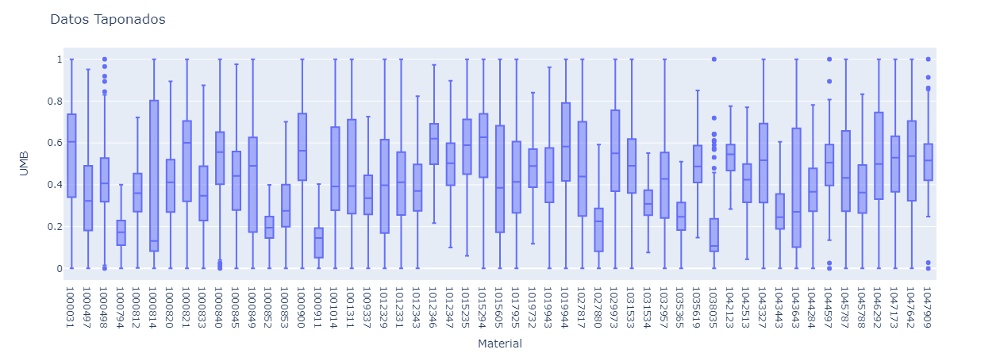

In [48]:
nombres =df2a_material_Normalizado.columns
IQR = iqr(df2a_material_Normalizado, axis = 0, rng = (25, 75), interpolation = 'midpoint')
DC = IQR/2

Q1 = np.percentile(df2a_material_Normalizado, 25, axis = 0, interpolation = 'midpoint')
Q3 = np.percentile(df2a_material_Normalizado, 75, axis = 0, interpolation = 'midpoint')

Min_Limite2 = Q1 - 1.5*IQR
Max_Limite2 = Q3 + 1.5*IQR

datos_atipicos = [[] for _ in range(df2a_material_Normalizado.shape[1])]
pos_atipicos = [[] for _ in range(df2a_material_Normalizado.shape[1])]

for i in range(df2a_material_Normalizado.shape[1]):
    for j in range(df2a_material_Normalizado.shape[0]):
        if df2a_material_Normalizado.iloc[j, i] < Min_Limite2[i] or df2a_material_Normalizado.iloc[j, i] > Max_Limite2[i]:
            datos_atipicos[i].append(df2a_material_Normalizado.iloc[j, i])
            pos_atipicos[i].append(j)

Numero_datos_atipicos = [len(datos_atipicos[i]) for i in range(len(datos_atipicos))]
reporte = pd.DataFrame(Numero_datos_atipicos, index=nombres, columns=['Número de Datos Atípicos'])
# display(reporte) 

Datos_taponados2 = df2a_material_Normalizado.copy()

cols = nombres
for i,col in enumerate(cols):
    Datos_taponados2[col] = np.where(Datos_taponados2[col] > Max_Limite2[i], Max_Limite2[i],
                                np.where(Datos_taponados2[col] < Min_Limite2[i], Min_Limite2[i], Datos_taponados2[col]))
								
# Create the box plot
fig = px.box(Datos_taponados2)

# Update the layout
fig.update_layout(title='Datos Taponados',xaxis_title='Material',yaxis_title='UMB',height=450)

# Display the plot
fig.show()

In [49]:
H_1 = entr(df2a_material_Normalizado)
H_2 = entr(Datos_taponados2)

entropia_normalizada_1 = H_1.sum()/df2a_material_Normalizado.shape[0]
entropia_normalizada_2 = H_2.sum()/Datos_taponados2.shape[0]

entropia_normalizada_1 = pd.DataFrame(entropia_normalizada_2, index = None, columns = ['Entropia Original'])
entropia_normalizada_2 = pd.DataFrame(entropia_normalizada_2, index = None, columns = ['Entropia IQR Taponado'])
Comparacion_entropias = pd.concat([entropia_normalizada_1, entropia_normalizada_2], axis = 1)

display(Comparacion_entropias)

,Entropia Original,Entropia IQR Taponado
material,,
1000031,0.278287,0.278287
1000497,0.306548,0.306548
1000498,0.314151,0.314151
1000794,0.285053,0.285053
1000812,0.337481,0.337481
1000814,0.198335,0.198335
1000820,0.323300,0.323300
1000821,0.284068,0.284068
1000833,0.316488,0.316488


In [50]:
df2a_material_sinout=Datos_taponados2.copy()

<AxesSubplot:xlabel='material', ylabel='semana'>

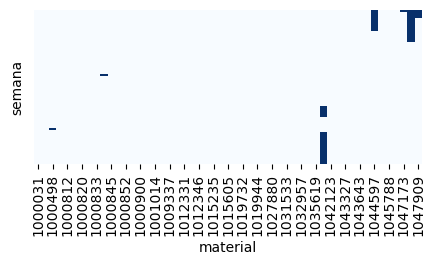

In [51]:
# identificar faltaltes en las series (azul oscuro zonas con datos faltantes)
plt.subplots(figsize=(5, 2))
sns.heatmap(df2a_material_sinout.isnull(), yticklabels=False, cbar=False, cmap = "Blues")

In [52]:
nulos_materiales2 =pd.DataFrame(df2a_material_sinout.isnull().sum()).reset_index()
nulos_materiales2 = nulos_materiales2[nulos_materiales2[0] >0]
nulos_materiales2["Porcentaje/Periodos"] = nulos_materiales2[0]/len(df.semanacalendario.unique())*100
nulos_materiales2 = nulos_materiales2.rename(columns={0:'cantidadPeriodosVacios'})
nulos_materiales2= nulos_materiales2.sort_values(by='Porcentaje/Periodos',ascending=False)
nulos_materiales2

,material,cantidadPeriodosVacios,Porcentaje/Periodos
39,1038035,43,27.741935
51,1047642,33,21.290323
46,1044597,22,14.193548
52,1047909,8,5.161290
2,1000498,2,1.290323
9,1000840,2,1.290323
50,1047173,2,1.290323


Se procedera a imputar los datos con información faltante

In [53]:
df2a_material[nulos_materiales2.material.unique()]

material,1038035,1047642,1044597,1047909,1000498,1000840,1047173
semana,,,,,,,
2020-03-02,1132.0,NaN,NaN,NaN,544.333,2498.545,NaN
2020-03-09,1180.0,NaN,NaN,NaN,1095.333,3671.445,NaN
2020-03-16,2802.0,NaN,NaN,NaN,305.000,2205.495,251.148
2020-03-23,1593.0,NaN,NaN,NaN,220.334,934.211,60.121
2020-03-30,2543.0,NaN,NaN,NaN,347.333,1392.940,103.010
...,...,...,...,...,...,...,...
2023-01-16,NaN,1326.000,119587.0,340.536,1180.000,5272.000,2275.922
2023-01-23,NaN,944.859,143479.0,256.292,319.667,3553.500,990.373
2023-01-30,NaN,1070.000,124350.0,216.120,484.333,2932.500,1281.604


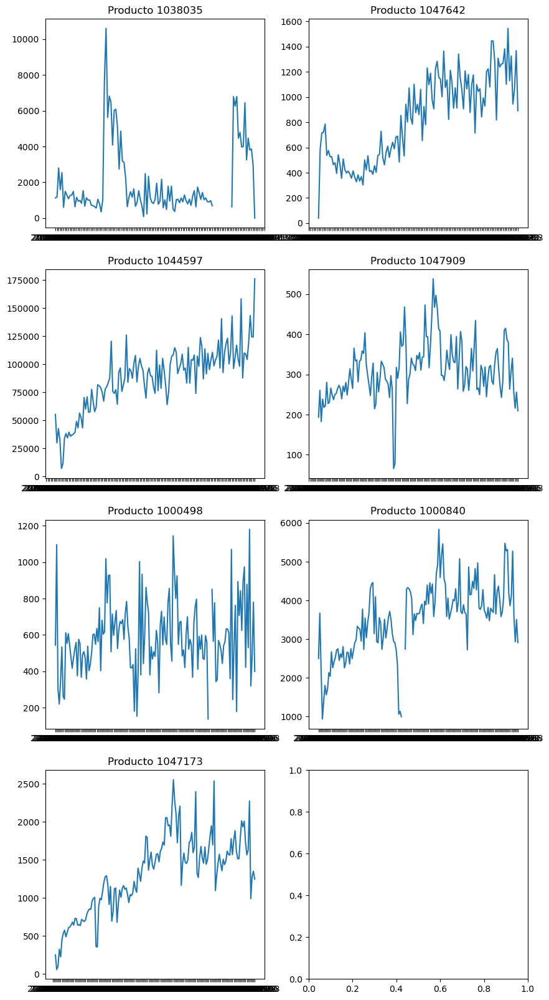

In [54]:
fig, axs = plt.subplots(nrows=4, ncols=2, figsize=(10, 20))  # Dos columnas
axs = axs.flatten()  # Aplanar los ejes

for i, col in enumerate(df2a_material[nulos_materiales2.material.unique()].columns):
    axs[i].plot(df2a_material[nulos_materiales2.material.unique()][col])
    axs[i].set_title(f"Producto {col}")

    

Se imputaran los datos de las series de materiales, con menos del 30% de faltantes

### Imputación con regresión lineal

In [55]:
from sklearn.linear_model import LinearRegression
from sklearn.impute import KNNImputer

In [56]:
df2a_Material1=pd.DataFrame(df2a_material[nulos_materiales2.material.unique()]['1038035']).reset_index()
df2a_Material1

,semana,1038035
0,2020-03-02,1132.0
1,2020-03-09,1180.0
2,2020-03-16,2802.0
3,2020-03-23,1593.0
4,2020-03-30,2543.0
...,...,...
150,2023-01-16,NaN
151,2023-01-23,NaN
152,2023-01-30,NaN
153,2023-02-06,NaN


In [57]:
# crear un conjunto de datos de entrenamiento y un conjunto de datos de prueba
df_train = df2a_Material1.dropna()
df_test = df2a_Material1[df2a_Material1.isnull().any(axis=1)]
df_train['fecha_num'] = pd.to_datetime(df_train['semana']).apply(lambda x: x.toordinal())
df_test['fecha_num'] = pd.to_datetime(df_test['semana']).apply(lambda x: x.toordinal())

In [58]:
# crear modelo de regresión lineal
model = LinearRegression()

# ajustar el modelo a los datos de entrenamiento
model.fit(df_train[['fecha_num']], df_train['1038035'])

LinearRegression()

In [59]:
# hacer predicciones en el conjunto de prueba
df_test['1038035'] = model.predict(df_test[['fecha_num']])

In [60]:
# combinar el conjunto de entrenamiento y el conjunto de prueba
df_filled = pd.concat([df_train, df_test], axis=0)
df_filled = df_filled.sort_values(by='semana').reset_index(drop=True)

print(df_filled)

         semana      1038035  fecha_num
0    2020-03-02  1132.000000     737486
1    2020-03-09  1180.000000     737493
2    2020-03-16  2802.000000     737500
3    2020-03-23  1593.000000     737507
4    2020-03-30  2543.000000     737514
..          ...          ...        ...
150  2023-01-16  2849.007031     738536
151  2023-01-23  2857.714199     738543
152  2023-01-30  2866.421367     738550
153  2023-02-06  2875.128534     738557
154  2023-02-13  2883.835702     738564

[155 rows x 3 columns]


<AxesSubplot:>

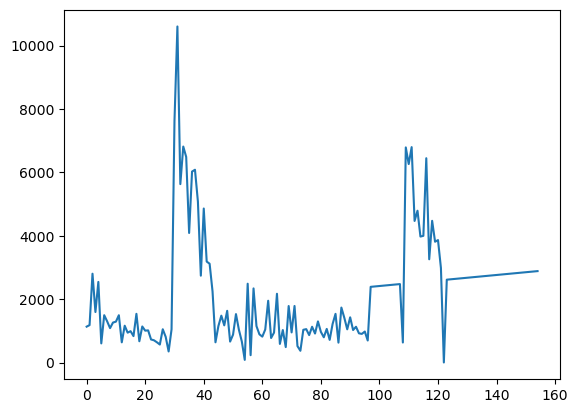

In [61]:
df_filled['1038035'].plot()

### Imputación con KNN

In [62]:
df2a_Material1

,semana,1038035
0,2020-03-02,1132.0
1,2020-03-09,1180.0
2,2020-03-16,2802.0
3,2020-03-23,1593.0
4,2020-03-30,2543.0
...,...,...
150,2023-01-16,NaN
151,2023-01-23,NaN
152,2023-01-30,NaN
153,2023-02-06,NaN


In [63]:
df2a_Material1['fechaCorregida']= pd.to_datetime(df2a_Material1['semana']).apply(lambda x: x.toordinal())

In [64]:
df2a_Material1_c=df2a_Material1[['fechaCorregida','1038035']]

In [65]:
imp_5 = KNNImputer(missing_values = np.nan, n_neighbors = 5, weights= "distance") # distancia Euclidiana
# Imputación por el algoritmo KNN con 5 vecinos y promedio ponderado donde 
# los vecinos más cercanos de un valor tendrán una mayor influencia que los vecinos que están más lejos.
imp_5.fit(df2a_Material1_c)
Datos_Imputacion_KNN_1 = imp_5.transform(df2a_Material1_c)

In [66]:
Datos_Imputacion_KNN_1=pd.DataFrame(Datos_Imputacion_KNN_1, columns = ['fechaCorregida','1038035'])
Datos_Imputacion_KNN_1

,fechaCorregida,1038035
0,737486.0,1132.000000
1,737493.0,1180.000000
2,737500.0,2802.000000
3,737507.0,1593.000000
4,737514.0,2543.000000
...,...,...
150,738536.0,2959.310907
151,738543.0,2961.502501
152,738550.0,2963.554043
153,738557.0,2965.478558


<AxesSubplot:>

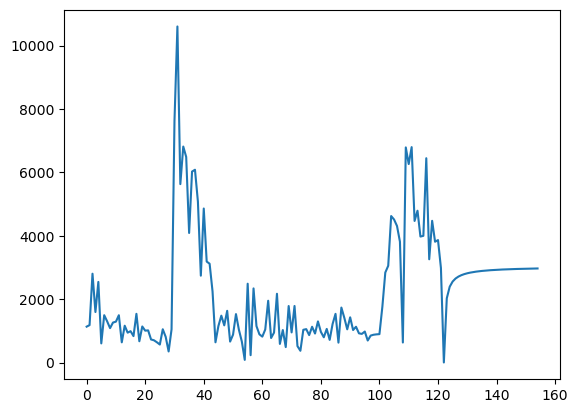

In [67]:
Datos_Imputacion_KNN_1['1038035'].plot()

Luego de realizar una primera imputación por regresión lineal y por KNN, se decide realizar para las demas series imputación por KNN

Es un método de imputación basado en el algoritmo de los vecinos más cercanos o KNN. Este método rellena los valores faltantes por medio de un cálculo de la distancia euclidiana de los vecinos más cercanos y a cada característica, se imputa los valores faltantes a través de un promedio uniforme. Sin embargo, si a cada característica le falta más de un valor, los vecinos para esa muestra pueden ser diferentes dependiendo de la característica particular que se imputa. Es importante tener en cuenta que si el número de vecinos que define el usuario es menor al número de vecinos que se puede determinar en los datos, y además que no hay distancias euclidianas que se puedan calcular, la imputación se realiza por un promedio de los valores existentes (como en la imputación por la media). En caso que hay al menos un vecino con distancia calculada, se aplica un promedio ponderado o no ponderado con los vecinos restantes.

In [68]:
df2a_material[nulos_materiales2.material.unique()]

material,1038035,1047642,1044597,1047909,1000498,1000840,1047173
semana,,,,,,,
2020-03-02,1132.0,NaN,NaN,NaN,544.333,2498.545,NaN
2020-03-09,1180.0,NaN,NaN,NaN,1095.333,3671.445,NaN
2020-03-16,2802.0,NaN,NaN,NaN,305.000,2205.495,251.148
2020-03-23,1593.0,NaN,NaN,NaN,220.334,934.211,60.121
2020-03-30,2543.0,NaN,NaN,NaN,347.333,1392.940,103.010
...,...,...,...,...,...,...,...
2023-01-16,NaN,1326.000,119587.0,340.536,1180.000,5272.000,2275.922
2023-01-23,NaN,944.859,143479.0,256.292,319.667,3553.500,990.373
2023-01-30,NaN,1070.000,124350.0,216.120,484.333,2932.500,1281.604


In [69]:
imp_5 = KNNImputer(missing_values = np.nan, n_neighbors = 5, weights= "distance") # distancia Euclidiana
# Imputación por el algoritmo KNN con 5 vecinos y promedio ponderado donde 
# los vecinos más cercanos de un valor tendrán una mayor influencia que los vecinos que están más lejos.
imp_5.fit(df2a_material[nulos_materiales2.material.unique()])
Datos_Imputacion_KNN_1 = imp_5.transform(df2a_material[nulos_materiales2.material.unique()])

In [70]:
Datos_Imputacion_KNN_1 = pd.DataFrame(Datos_Imputacion_KNN_1, columns = nulos_materiales2.material.unique())

In [71]:
Datos_Imputacion_KNN_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 155 entries, 0 to 154
Data columns (total 7 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   1038035  155 non-null    float64
 1   1047642  155 non-null    float64
 2   1044597  155 non-null    float64
 3   1047909  155 non-null    float64
 4   1000498  155 non-null    float64
 5   1000840  155 non-null    float64
 6   1047173  155 non-null    float64
dtypes: float64(7)
memory usage: 8.6 KB


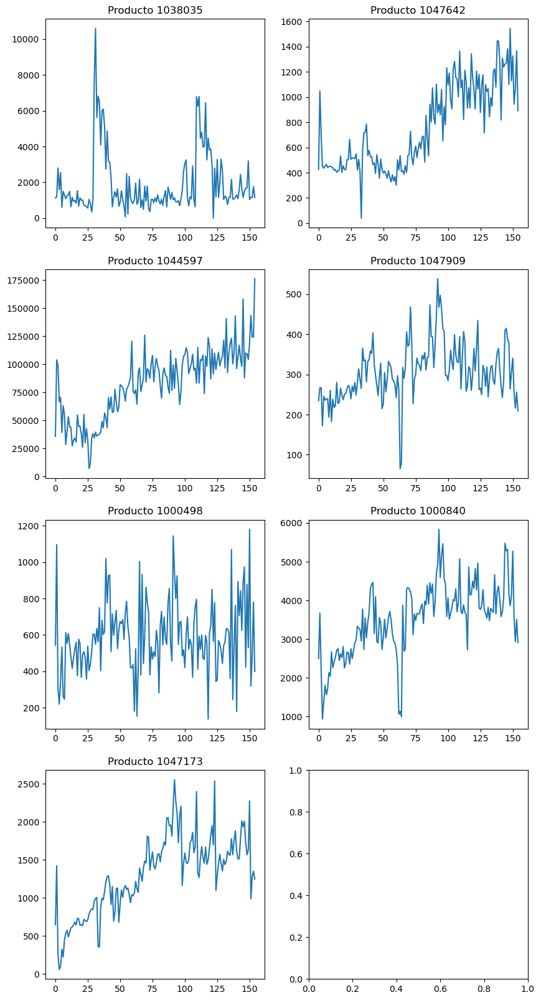

In [72]:
fig, axs = plt.subplots(nrows=4, ncols=2, figsize=(10, 20))  # Dos columnas
axs = axs.flatten()  # Aplanar los ejes

for i, col in enumerate(Datos_Imputacion_KNN_1.columns):
    axs[i].plot(Datos_Imputacion_KNN_1[col])
    axs[i].set_title(f"Producto {col}")

Se ingresara en el dataset los valores ya sin la información faltante

In [73]:
imp_5 = KNNImputer(missing_values = np.nan, n_neighbors = 5, weights= "distance") # distancia Euclidiana
# Imputación por el algoritmo KNN con 5 vecinos y promedio ponderado donde 
# los vecinos más cercanos de un valor tendrán una mayor influencia que los vecinos que están más lejos.
imp_5.fit(df2a_material)
Datos_Imputacion_KNN_1 = imp_5.transform(df2a_material)

In [75]:
df2a_material.columns

Index(['1000031', '1000497', '1000498', '1000794', '1000812', '1000814',
       '1000820', '1000821', '1000833', '1000840', '1000845', '1000849',
       '1000852', '1000853', '1000900', '1000911', '1001014', '1001311',
       '1009337', '1012329', '1012331', '1012343', '1012346', '1012347',
       '1015235', '1015294', '1015605', '1017925', '1019732', '1019943',
       '1019944', '1027817', '1027880', '1029973', '1031533', '1031534',
       '1032957', '1035365', '1035619', '1038035', '1042123', '1042513',
       '1043327', '1043443', '1043643', '1044284', '1044597', '1045787',
       '1045788', '1046292', '1047173', '1047642', '1047909'],
      dtype='object', name='material')

In [76]:
Datos_Imputacion_KNN_1 = pd.DataFrame(Datos_Imputacion_KNN_1, columns = df2a_material.columns)

In [77]:
Datos_Imputacion_KNN_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 155 entries, 0 to 154
Data columns (total 53 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   1000031  155 non-null    float64
 1   1000497  155 non-null    float64
 2   1000498  155 non-null    float64
 3   1000794  155 non-null    float64
 4   1000812  155 non-null    float64
 5   1000814  155 non-null    float64
 6   1000820  155 non-null    float64
 7   1000821  155 non-null    float64
 8   1000833  155 non-null    float64
 9   1000840  155 non-null    float64
 10  1000845  155 non-null    float64
 11  1000849  155 non-null    float64
 12  1000852  155 non-null    float64
 13  1000853  155 non-null    float64
 14  1000900  155 non-null    float64
 15  1000911  155 non-null    float64
 16  1001014  155 non-null    float64
 17  1001311  155 non-null    float64
 18  1009337  155 non-null    float64
 19  1012329  155 non-null    float64
 20  1012331  155 non-null    float64
 21  1012343  155 non

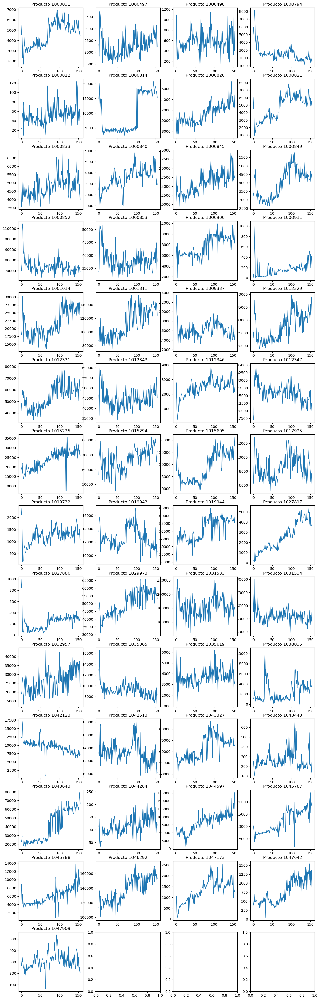

In [84]:
fig, axs = plt.subplots(nrows=14, ncols=4, figsize=(15, 50))  # Dos columnas
axs = axs.flatten()  # Aplanar los ejes

for i, col in enumerate(Datos_Imputacion_KNN_1.columns):
    axs[i].plot(Datos_Imputacion_KNN_1[col])
    axs[i].set_title(f"Producto {col}")

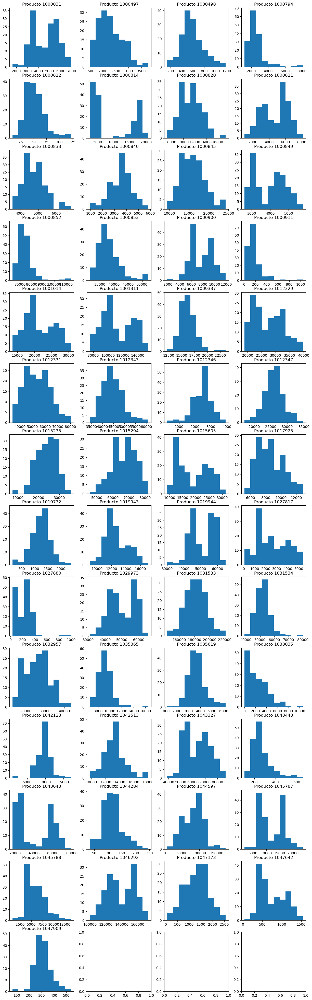

In [88]:
fig, axs = plt.subplots(nrows=14, ncols=4, figsize=(15, 50))  # Dos columnas
axs = axs.flatten()  # Aplanar los ejes

for i, col in enumerate(Datos_Imputacion_KNN_1.columns):
    axs[i].hist(Datos_Imputacion_KNN_1[col])
    axs[i].set_title(f"Producto {col}")

In [85]:
ProductosSeleccionados = Datos_Imputacion_KNN_1.copy()

## Entendimiento de la data

In [86]:
ProductosSeleccionados

material,1000031,1000497,1000498,1000794,1000812,1000814,1000820,1000821,1000833,1000840,...,1043443,1043643,1044284,1044597,1045787,1045788,1046292,1047173,1047642,1047909
0,4553.695,2347.000,544.333,5981.0,24.0,14851.851,7356.609,4503.815,3573.975,2498.545,...,249.335,22960.040,110.939,50176.700754,10148.760,8880.0,113025.608,732.990088,385.406163,269.992169
1,5492.006,1822.000,1095.333,5012.0,24.0,20132.220,8500.055,6022.121,4475.146,3671.445,...,196.332,25470.400,142.875,67663.379795,8735.300,5064.0,121110.343,1053.363983,471.146709,307.053783
2,3870.255,3676.000,305.000,6980.0,54.0,17560.170,10662.832,2794.617,3850.982,2205.495,...,152.667,29341.360,61.605,68121.540213,6737.240,4227.0,136362.053,251.148000,695.461646,339.363365
3,2284.952,3771.000,220.334,8112.0,55.0,12551.380,7451.010,962.701,4442.017,934.211,...,106.336,29283.440,39.896,42056.192999,3649.804,6486.0,126563.382,60.121000,486.295974,299.179125
4,4020.223,3540.000,347.333,7770.0,40.0,14913.400,10086.938,1370.585,5302.665,1392.940,...,122.336,29132.040,54.938,42498.666564,6386.272,5639.0,129238.568,103.010000,620.067963,293.661153
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
150,5917.500,2829.625,1180.000,1768.0,56.0,19041.167,13598.722,5955.619,5770.000,5272.000,...,217.333,62679.652,190.000,119587.000000,23782.500,12382.0,165999.862,2275.922000,1326.000000,340.536000
151,5024.438,2208.000,319.667,1362.0,40.0,16284.000,12549.986,4863.438,4954.501,3553.500,...,203.334,58798.000,86.875,143479.000000,15363.100,8245.0,150738.864,990.373000,944.859000,256.292000
152,4574.348,3158.000,484.333,1944.0,40.0,17300.000,13760.514,4977.264,4293.500,2932.500,...,244.334,72342.000,127.875,124350.000000,19986.400,10641.0,158124.138,1281.604000,1070.000000,216.120000
153,4894.297,2957.000,780.001,1817.0,65.0,17495.556,14919.447,5479.046,4888.500,3505.500,...,155.001,79143.000,106.937,124272.000000,18814.900,9173.0,159626.702,1352.169000,1368.092000,255.791000


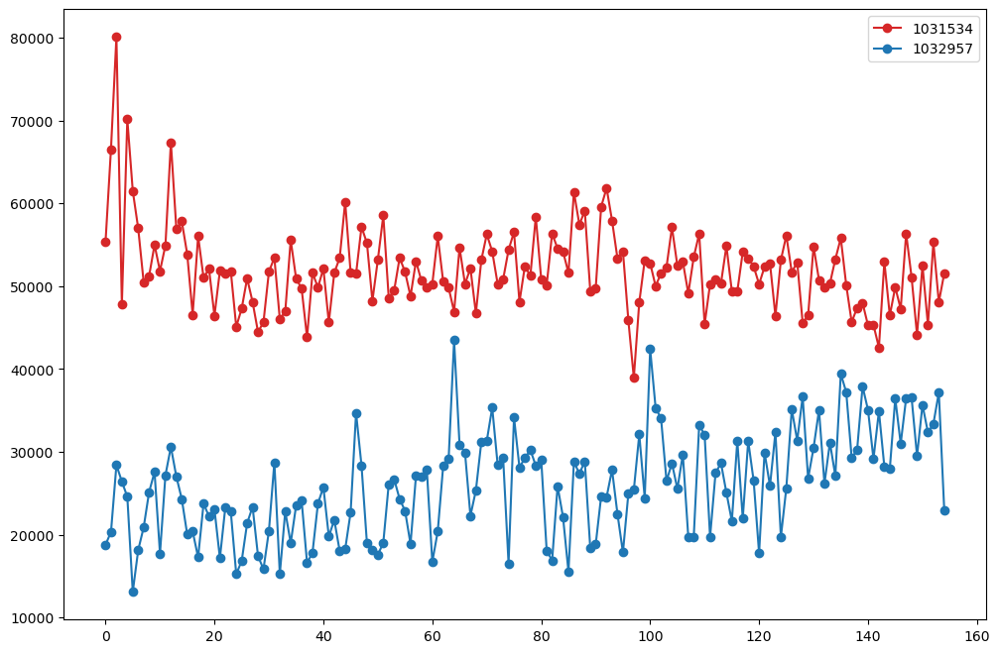

In [200]:
x = ProductosSeleccionados['1031534']
y = ProductosSeleccionados['1032957']

plt.figure(figsize=(12, 8))
plt.plot(x, "-o", c="C3")
plt.plot(y, "-o", c="C0")
plt.legend([x.name, y.name]);

In [180]:
ProductosSeleccionados_mediaMovil = pd.DataFrame()

for columna in ProductosSeleccionados.columns:
    ProductosSeleccionados_mediaMovil[columna]= ProductosSeleccionados[columna].rolling(window=2).mean()
ProductosSeleccionados_mediaMovil=ProductosSeleccionados_mediaMovil.dropna().reset_index(drop=True)
ProductosSeleccionados_mediaMovil


,1000031,1000497,1000498,1000794,1000812,1000814,1000820,1000821,1000833,1000840,...,1043443,1043643,1044284,1044597,1045787,1045788,1046292,1047173,1047642,1047909
0,5022.8505,2084.5000,819.8330,5496.5,24.0,17492.0355,7928.3320,5262.9680,4024.5605,3084.9950,...,222.8335,24215.2200,126.9070,58920.040275,9442.030,6972.0,117067.9755,893.177036,428.276436,288.522976
1,4681.1305,2749.0000,700.1665,5996.0,39.0,18846.1950,9581.4435,4408.3690,4163.0640,2938.4700,...,174.4995,27405.8800,102.2400,67892.460004,7736.270,4645.5,128736.1980,652.255992,583.304177,323.208574
2,3077.6035,3723.5000,262.6670,7546.0,54.5,15055.7750,9056.9210,1878.6590,4146.4995,1569.8530,...,129.5015,29312.4000,50.7505,55088.866606,5193.522,5356.5,131462.7175,155.634500,590.878810,319.271245
3,3152.5875,3655.5000,283.8335,7941.0,47.5,13732.3900,8768.9740,1166.6430,4872.3410,1163.5755,...,114.3360,29207.7400,47.4170,42277.429781,5018.038,6062.5,127900.9750,81.565500,553.181968,296.420139
4,3032.2150,3307.5000,440.6665,6352.0,24.5,14184.8555,8635.1090,1534.8930,4869.1575,1597.5975,...,159.8360,23594.0400,44.4690,49380.344227,5674.662,4501.0,115058.4720,214.167500,559.014463,275.305780
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149,5457.8750,2691.3125,855.0000,1940.5,60.0,18802.0835,13547.8435,5643.5115,5333.0000,4698.7890,...,208.1670,61136.3635,160.5000,111917.500000,23139.800,11556.5,161213.4160,1953.074000,1227.759500,323.266500
150,5470.9690,2518.8125,749.8335,1565.0,48.0,17662.5835,13074.3540,5409.5285,5362.2505,4412.7500,...,210.3335,60738.8260,138.4375,131533.000000,19572.800,10313.5,158369.3630,1633.147500,1135.429500,298.414000
151,4799.3930,2683.0000,402.0000,1653.0,40.0,16792.0000,13155.2500,4920.3510,4624.0005,3243.0000,...,223.8340,65570.0000,107.3750,133914.500000,17674.750,9443.0,154431.5010,1135.988500,1007.429500,236.206000
152,4734.3225,3057.5000,632.1670,1880.5,52.5,17397.7780,14339.9805,5228.1550,4591.0000,3219.0000,...,199.6675,75742.5000,117.4060,124311.000000,19400.650,9907.0,158875.4200,1316.886500,1219.046000,235.955500


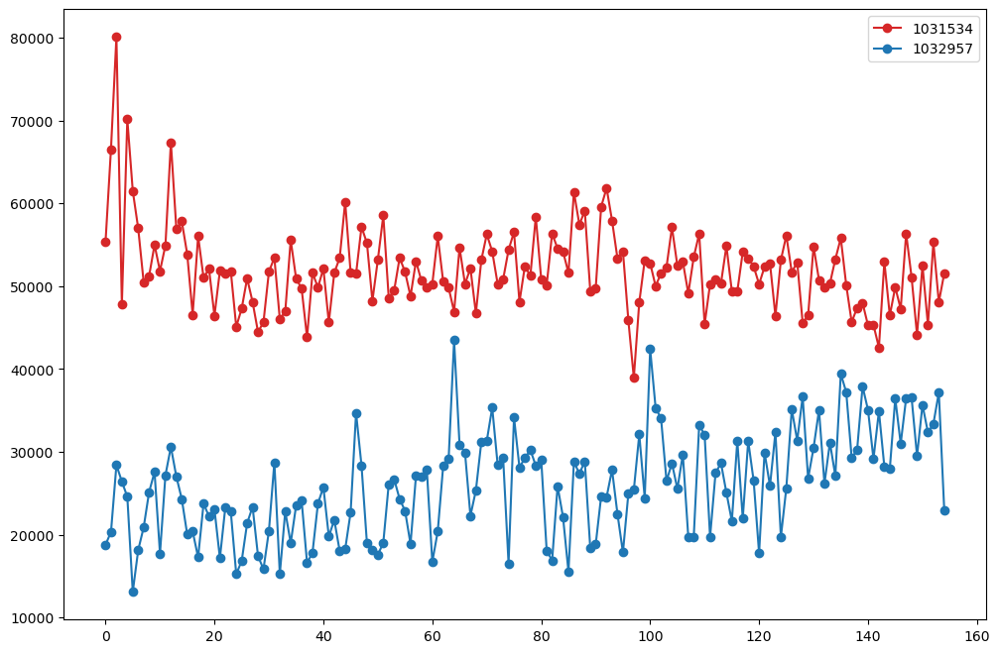

In [201]:
w = ProductosSeleccionados_mediaMovil['1031534']
z = ProductosSeleccionados_mediaMovil['1032957']

plt.figure(figsize=(12, 8))
plt.plot(x, "-o", c="C3")
plt.plot(y, "-o", c="C0")
plt.legend([x.name, y.name]);

## Preprocesamiento

Se procede a normalizar el dataset Productos Seleccionados, con las siguentes metodologias:
1. Z-Score Normalization <br>
2. MinMax Normalization <br>

In [315]:
from sklearn.preprocessing import StandardScaler
ss = StandardScaler()
scaled_ss = ss.fit_transform(ProductosSeleccionados_mediaMovil)
df_ss = pd.DataFrame(scaled_ss, columns=ProductosSeleccionados_mediaMovil.columns, index=ProductosSeleccionados_mediaMovil.index)
X_ss = df_ss.values
df_ss.head()

,1000031,1000497,1000498,1000794,1000812,1000814,1000820,1000821,1000833,1000840,...,1043443,1043643,1044284,1044597,1045787,1045788,1046292,1047173,1047642,1047909
0,0.379637,-0.490156,1.623346,3.008351,-1.810216,1.281932,-1.981634,0.335837,-1.445048,-0.497196,...,-0.563363,-0.955579,0.377116,-0.885924,-0.593966,0.523234,-1.343519,-0.843307,-1.036445,-0.339275
1,0.072843,1.208671,0.787494,3.517314,-0.848465,1.495910,-1.013878,-0.205469,-1.184847,-0.664868,...,-1.167710,-0.772070,-0.473131,-0.554363,-0.989206,-0.679810,-0.610470,-1.337401,-0.545882,0.220155
2,-1.366793,3.700028,-2.268374,5.096678,0.145345,0.896965,-1.320941,-1.807796,-1.215966,-2.231014,...,-1.730345,-0.662418,-2.247925,-1.027498,-1.578385,-0.312149,-0.439178,-2.355900,-0.521913,0.156652
3,-1.299473,3.526183,-2.120529,5.499161,-0.303472,0.687850,-1.489510,-2.258789,0.147642,-2.695929,...,-1.919967,-0.668438,-2.362827,-1.500923,-1.619046,0.052927,-0.662942,-2.507804,-0.641199,-0.211905
4,-1.407543,2.636504,-1.025075,3.880058,-1.778157,0.759347,-1.567876,-2.025538,0.141661,-2.199265,...,-1.351056,-0.991306,-2.464442,-1.238447,-1.466900,-0.754532,-1.469765,-2.235857,-0.622743,-0.552450


In [217]:
# from sklearn.preprocessing import StandardScaler
# ss = StandardScaler()
# scaled_ss = ss.fit_transform(ProductosSeleccionados_mediaMovil.T)
# df_ss = pd.DataFrame(scaled_ss.T, columns=ProductosSeleccionados_mediaMovil.columns, index=ProductosSeleccionados_mediaMovil.index)
# X_ss = df_ss.values
# df_ss.head()

,1000031,1000497,1000498,1000794,1000812,1000814,1000820,1000821,1000833,1000840,...,1043443,1043643,1044284,1044597,1045787,1045788,1046292,1047173,1047642,1047909
0,-0.567027,-0.662041,-0.702935,-0.551711,-0.728669,-0.163825,-0.473076,-0.559263,-0.599308,-0.629689,...,-0.722240,0.053575,-0.725342,1.175786,-0.424129,-0.504000,3.056051,-0.700564,-0.715597,-0.720116
1,-0.582081,-0.635602,-0.692356,-0.545658,-0.710671,-0.189699,-0.446339,-0.589636,-0.596431,-0.630354,...,-0.706917,0.047411,-0.708919,1.168917,-0.497451,-0.583068,2.854330,-0.693683,-0.695593,-0.702798
2,-0.611210,-0.594750,-0.682946,-0.497337,-0.688251,-0.305957,-0.458833,-0.641764,-0.583971,-0.649634,...,-0.686340,0.057360,-0.688347,0.714250,-0.557288,-0.553135,2.660568,-0.685674,-0.674582,-0.681504
3,-0.591690,-0.579001,-0.664072,-0.470872,-0.670035,-0.324747,-0.449981,-0.641798,-0.548298,-0.641875,...,-0.668349,0.065716,-0.670037,0.395482,-0.544622,-0.518269,2.555878,-0.669176,-0.657276,-0.663755
4,-0.586840,-0.579502,-0.655918,-0.498350,-0.667011,-0.289563,-0.437493,-0.626751,-0.537876,-0.625080,...,-0.663404,-0.038759,-0.666479,0.648580,-0.516405,-0.547689,2.399246,-0.661955,-0.652763,-0.660326


In [316]:
from sklearn.preprocessing import MinMaxScaler
mm = MinMaxScaler()
scaled_mm = mm.fit_transform(ProductosSeleccionados_mediaMovil)
df_mm = pd.DataFrame(scaled_mm, columns=ProductosSeleccionados_mediaMovil.columns, index=ProductosSeleccionados_mediaMovil.index)
X_mm = df_mm.values
df_mm.head()

,1000031,1000497,1000498,1000794,1000812,1000814,1000820,1000821,1000833,1000840,...,1043443,1043643,1044284,1044597,1045787,1045788,1046292,1047173,1047642,1047909
0,0.628443,0.259275,0.716458,0.635068,0.079070,0.860810,0.059878,0.624239,0.106995,0.468392,...,0.222407,0.104126,0.458129,0.352866,0.244126,0.469344,0.158642,0.348134,0.119318,0.502553
1,0.560709,0.559587,0.564758,0.709636,0.218605,0.940274,0.247837,0.494007,0.157213,0.434437,...,0.123328,0.159600,0.321824,0.416457,0.149998,0.228452,0.352580,0.244793,0.253536,0.583121
2,0.242865,1.000000,0.010142,0.941032,0.362791,0.717847,0.188199,0.108504,0.151207,0.117276,...,0.031087,0.192748,0.037302,0.325713,0.009684,0.302071,0.397897,0.031771,0.260094,0.573975
3,0.257728,0.969268,0.036974,1.000000,0.297674,0.640189,0.155459,0.000000,0.414381,0.023127,...,0.000000,0.190928,0.018882,0.234914,0.000000,0.375172,0.338698,0.000000,0.227457,0.520897
4,0.233868,0.811994,0.235791,0.762783,0.083721,0.666740,0.140239,0.056118,0.413226,0.123706,...,0.093270,0.093326,0.002592,0.285255,0.036234,0.213490,0.125242,0.056878,0.232507,0.471852


In [220]:
# from sklearn.preprocessing import MinMaxScaler
# mm = MinMaxScaler()
# scaled_mm = mm.fit_transform(ProductosSeleccionados_mediaMovil.T)
# df_mm = pd.DataFrame(scaled_mm.T, columns=ProductosSeleccionados_mediaMovil.columns, index=ProductosSeleccionados_mediaMovil.index)
# X_mm = df_mm.values
# df_mm.head()

,1000031,1000497,1000498,1000794,1000812,1000814,1000820,1000821,1000833,1000840,...,1043443,1043643,1044284,1044597,1045787,1045788,1046292,1047173,1047642,1047909
0,0.032500,0.013396,0.005174,0.035580,0.000000e+00,0.113569,0.051390,0.034061,0.026010,0.019901,...,0.001293,0.157280,0.000669,0.382915,0.061232,0.045173,0.760965,0.005651,0.002628,0.001720
1,0.024988,0.014588,0.003559,0.032066,0.000000e+00,0.101238,0.051366,0.023520,0.022199,0.015608,...,0.000729,0.147314,0.000340,0.365250,0.041434,0.024796,0.692766,0.003301,0.002930,0.001530
2,0.014516,0.017614,0.001016,0.035945,1.798167e-05,0.071960,0.043191,0.008766,0.019642,0.007285,...,0.000378,0.140332,0.000000,0.263949,0.024663,0.025445,0.630219,0.000503,0.002590,0.001288
3,0.014519,0.016870,0.001105,0.036907,3.880775e-07,0.063986,0.040779,0.005233,0.022560,0.005219,...,0.000313,0.136343,0.000000,0.197452,0.023241,0.028124,0.597796,0.000160,0.002365,0.001164
4,0.014655,0.015996,0.002028,0.030830,0.000000e+00,0.068995,0.041955,0.007359,0.023605,0.007665,...,0.000659,0.114841,0.000097,0.240483,0.027530,0.021811,0.560496,0.000924,0.002604,0.001222


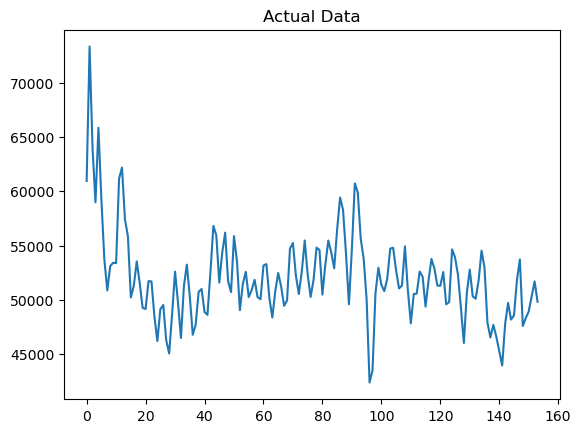

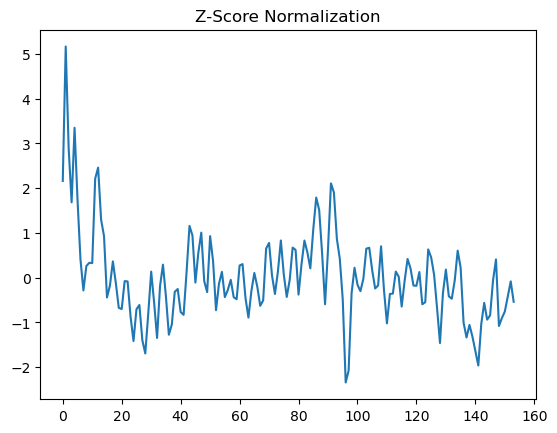

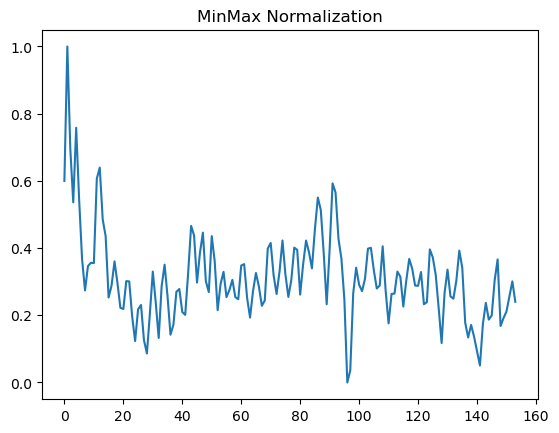

In [317]:
# Select a product Id to compare normal data with scaled data
product = "1031534"

# Visualize the sales (qty) for the product
ProductosSeleccionados_mediaMovil[product].plot(title="Actual Data"), plt.show()
df_ss[product].plot(title="Z-Score Normalization"), plt.show()
df_mm[product].plot(title="MinMax Normalization"), plt.show();

Se define trabajar con la normalizacion MinMax

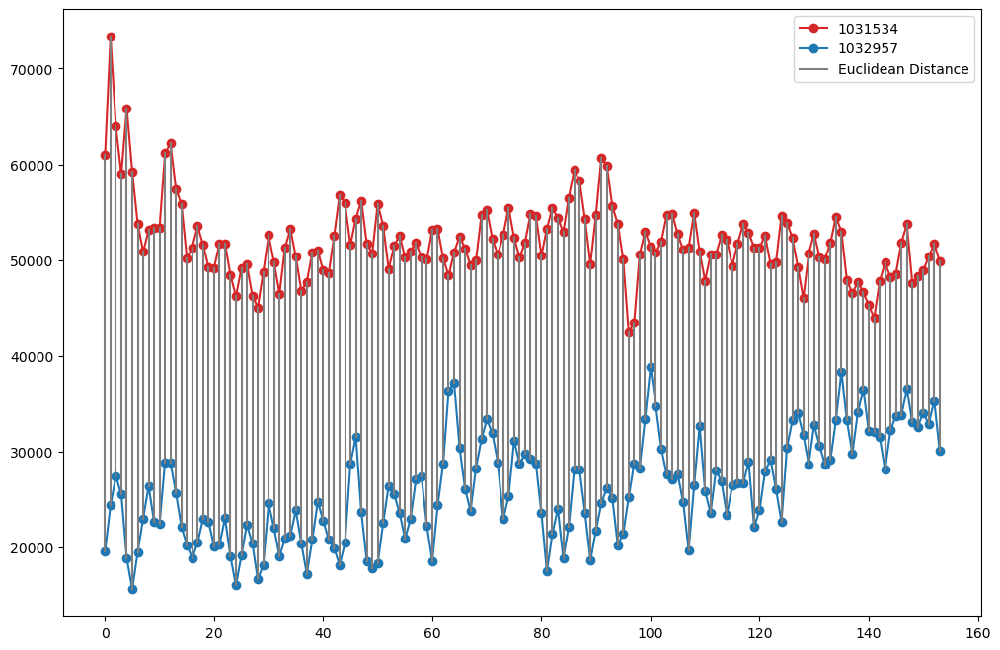

In [318]:
# Graphic representation of Euclidean Distance -One to One Match
plt.figure(figsize=(12, 8))
plt.plot(np.arange(w.shape[0]), w, "-o", c="C3")
plt.plot(np.arange(z.shape[0]), z, "-o", c="C0")
for i, (x_i, y_j) in enumerate(zip(w,  z)):
    plt.plot([i, i], [x_i, y_j], c="C7")
plt.legend([w.name, z.name, "Euclidean Distance"]);

In [319]:
from matplotlib.patches import ConnectionPatch
import matplotlib.pyplot as plt
import numpy as np
import scipy.spatial.distance as dist

def dp(dist_mat):
    """
    Find minimum-cost path through matrix `dist_mat` using dynamic programming.

    The cost of a path is defined as the sum of the matrix entries on that
    path. See the following for details of the algorithm:

    - http://en.wikipedia.org/wiki/Dynamic_time_warping
    - https://www.ee.columbia.edu/~dpwe/resources/matlab/dtw/dp.m

    The notation in the first reference was followed, while Dan Ellis's code
    (second reference) was used to check for correctness. Returns a list of
    path indices and the cost matrix.
    """

    N, M = dist_mat.shape
    
    # Initialize the cost matrix
    cost_mat = np.zeros((N + 1, M + 1))
    for i in range(1, N + 1):
        cost_mat[i, 0] = np.inf
    for i in range(1, M + 1):
        cost_mat[0, i] = np.inf

    # Fill the cost matrix while keeping traceback information
    traceback_mat = np.zeros((N, M))
    for i in range(N):
        for j in range(M):
            penalty = [
                cost_mat[i, j],      # match (0)
                cost_mat[i, j + 1],  # insertion (1)
                cost_mat[i + 1, j]]  # deletion (2)
            i_penalty = np.argmin(penalty)
            cost_mat[i + 1, j + 1] = dist_mat[i, j] + penalty[i_penalty]
            traceback_mat[i, j] = i_penalty

    # Traceback from bottom right
    i = N - 1
    j = M - 1
    path = [(i, j)]
    while i > 0 or j > 0:
        tb_type = traceback_mat[i, j]
        if tb_type == 0:
            # Match
            i = i - 1
            j = j - 1
        elif tb_type == 1:
            # Insertion
            i = i - 1
        elif tb_type == 2:
            # Deletion
            j = j - 1
        path.append((i, j))

    # Strip infinity edges from cost_mat before returning
    cost_mat = cost_mat[1:, 1:]
    return (path[::-1], cost_mat)

In [320]:
# Distance matrix
N = w.shape[0]
M = z.shape[0]
dist_mat = np.zeros((N, M))
for i in range(N):
    for j in range(M):
        dist_mat[i, j] = abs(x[i] - y[j])
        # print (dist_mat[i, j])

In [207]:
N

154

In [192]:
# dist_mat = np.zeros((N, M))
# for i in range(1):
#     for j in range(1):
#         dist_mat[i, j] = abs(x[i] - y[j])
# print(i, j, dist_mat)

0 0 [[7100.204    0.       0.    ...    0.       0.       0.   ]
 [   0.       0.       0.    ...    0.       0.       0.   ]
 [   0.       0.       0.    ...    0.       0.       0.   ]
 ...
 [   0.       0.       0.    ...    0.       0.       0.   ]
 [   0.       0.       0.    ...    0.       0.       0.   ]
 [   0.       0.       0.    ...    0.       0.       0.   ]]


Alignment cost: 3861136.1900
Normalized alignment cost: 12536.1565


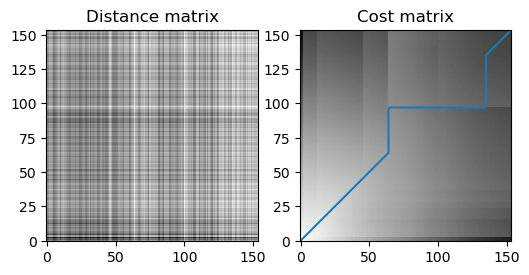

In [321]:
# DTW
path, cost_mat = dp(dist_mat)
print("Alignment cost: {:.4f}".format(cost_mat[N - 1, M - 1]))
print("Normalized alignment cost: {:.4f}".format(cost_mat[N - 1, M - 1]/(N + M)))

plt.figure(figsize=(6, 4))
plt.subplot(121)
plt.title("Distance matrix")
plt.imshow(dist_mat, cmap=plt.cm.binary, interpolation="nearest", origin="lower")
plt.subplot(122)
plt.title("Cost matrix")
plt.imshow(cost_mat, cmap=plt.cm.binary, interpolation="nearest", origin="lower")
x_path, y_path = zip(*path)
plt.plot(y_path, x_path);

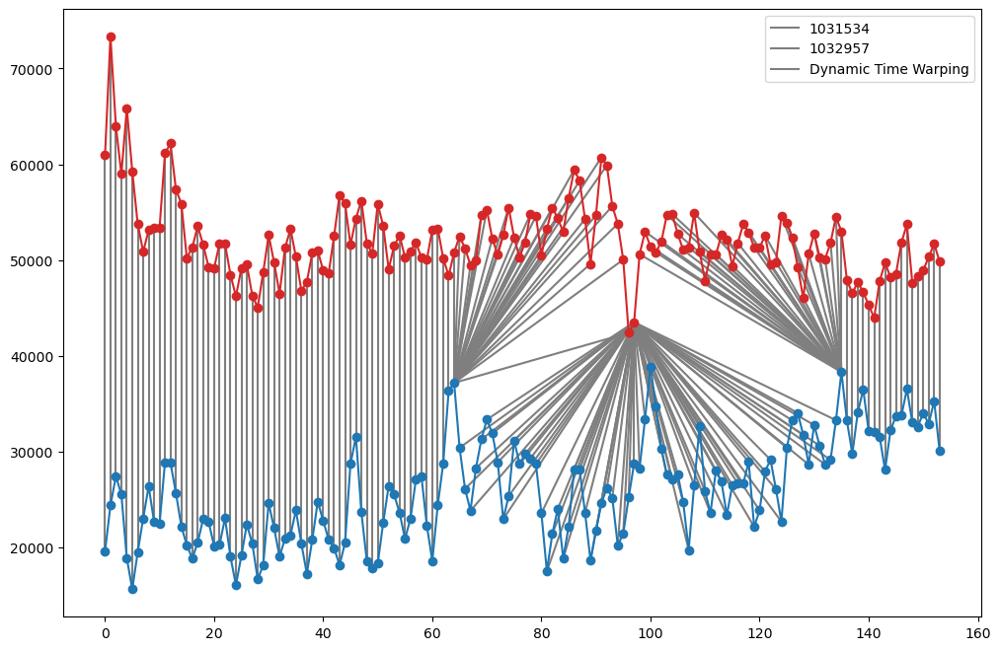

In [322]:
plt.figure(figsize=(12, 8))
for x_i, y_j in path:
    plt.plot([x_i, y_j], [w[x_i], z[y_j]], c="C7")
plt.plot(np.arange(w.shape[0]), w, "-o", c="C3")
plt.plot(np.arange(z.shape[0]), z, "-o", c="C0")
plt.legend([w.name, z.name, "Dynamic Time Warping"]);

## Se usara Tslearn para calcular K-Means con DTW, Soft-DTW y ED con su puntuación de silueta

Ejecutaremos el algoritmo en paralelo usando los dos conjuntos de datos escalados diferentes.
La idea es agruparlos bajo diferentes parámetros para encontrar la combinación con el mejor rendimiento.


In [208]:
try:
    from tslearn.clustering import TimeSeriesKMeans
    from tslearn.clustering import silhouette_score
except:
    import sys
    !{sys.executable} -m pip install tslearn
    from tslearn.clustering import TimeSeriesKMeans
    from tslearn.clustering import silhouette_score

import time

     -------------------------------------- 358.2/358.2 kB 1.4 MB/s eta 0:00:00


Se debe transponer el dataframe, definiendo cada semana movil como una columna y cada materia como fila

In [323]:
X_mm=df_mm.T.values
df_mm.T.head()

,0,1,2,3,4,5,6,7,8,9,...,144,145,146,147,148,149,150,151,152,153
1000031,0.628443,0.560709,0.242865,0.257728,0.233868,0.000000,0.233529,0.418571,0.315786,0.239706,...,0.766580,0.819082,0.771981,0.687947,0.644315,0.714672,0.717267,0.584150,0.571252,0.558561
1000497,0.259275,0.559587,1.000000,0.969268,0.811994,0.663985,0.623593,0.553994,0.581400,0.354147,...,0.566818,0.593482,0.572241,0.501513,0.489989,0.533516,0.455557,0.529759,0.699010,0.489537
1000498,0.716458,0.564758,0.010142,0.036974,0.235791,0.181914,0.000000,0.221847,0.416649,0.413268,...,0.639341,0.860131,0.562011,0.501585,0.569618,0.761039,0.627720,0.186773,0.478555,0.425101
1000794,0.635068,0.709636,0.941032,1.000000,0.762783,0.495857,0.404792,0.321863,0.358886,0.492722,...,0.133239,0.199597,0.198552,0.108159,0.105098,0.104202,0.048145,0.061282,0.095245,0.061133
1000812,0.079070,0.218605,0.362791,0.297674,0.083721,0.265116,0.506977,0.353488,0.246512,0.224419,...,0.772093,1.000000,0.944186,0.516279,0.297674,0.413953,0.302326,0.227907,0.344186,0.381395


In [324]:
X_ss=df_ss.T.values
df_ss.T.head()

,0,1,2,3,4,5,6,7,8,9,...,144,145,146,147,148,149,150,151,152,153
1000031,0.379637,0.072843,-1.366793,-1.299473,-1.407543,-2.466820,-1.409079,-0.570955,-1.036508,-1.381103,...,1.005309,1.243112,1.029773,0.649151,0.451524,0.770199,0.781955,0.179018,0.120598,0.063113
1000497,-0.490156,1.208671,3.700028,3.526183,2.636504,1.799234,1.570742,1.177034,1.332064,0.046524,...,1.249576,1.400412,1.280254,0.880154,0.814962,1.061190,0.620185,1.039939,1.997366,0.812406
1000498,1.623346,0.787494,-2.268374,-2.120529,-1.025075,-1.321931,-2.324253,-1.101901,-0.028567,-0.047196,...,1.198437,2.414967,0.772361,0.439418,0.814273,1.868982,1.134410,-1.295154,0.312527,0.018001
1000794,3.008351,3.517314,5.096678,5.499161,3.880058,2.058185,1.436629,0.870606,1.123304,2.036788,...,-0.416831,0.036090,0.028958,-0.588013,-0.608902,-0.615015,-0.997629,-0.907962,-0.676152,-0.908981
1000812,-1.810216,-0.848465,0.145345,-0.303472,-1.778157,-0.527881,1.139154,0.081228,-0.656115,-0.808392,...,2.966481,4.537341,4.152641,1.203271,-0.303472,0.497987,-0.271414,-0.784348,0.017111,0.273578


In [325]:
# Experiment number 1. (1/2)
silhoutte_score_ss = []

for i in range(2, 10):

    start = time.time()

    km = TimeSeriesKMeans(n_clusters=i, metric="dtw", max_iter=20, max_iter_barycenter=10, random_state=0)
    y_pred_ss = km.fit_predict(X_ss)
    score_ss = silhouette_score(X_ss, y_pred_ss, metric="dtw")
    silhoutte_score_ss.append(score_ss)

    stop = time.time()
    duration = stop - start

    print(f"K = {i}.", f"Took {duration:.2f} seconds to calculate.")

K = 2. Took 2.94 seconds to calculate.
K = 3. Took 3.03 seconds to calculate.
K = 4. Took 2.24 seconds to calculate.
K = 5. Took 2.34 seconds to calculate.
K = 6. Took 3.08 seconds to calculate.
K = 7. Took 2.72 seconds to calculate.
K = 8. Took 2.77 seconds to calculate.
K = 9. Took 2.66 seconds to calculate.


In [326]:
# Experiment number 1. (2/2)
silhoutte_score_mm = []

for i in range(2, 10):

    start = time.time()

    km = TimeSeriesKMeans(n_clusters=i, metric="dtw", max_iter=20, max_iter_barycenter=10, random_state=0)
    y_pred_mm = km.fit_predict(X_mm)
    score_mm = silhouette_score(X_mm, y_pred_mm, metric="dtw")
    silhoutte_score_mm.append(score_mm)

    stop = time.time()
    duration = stop - start

    print(f"K = {i}.", f"Took {duration:.2f} seconds to calculate.")

K = 2. Took 2.78 seconds to calculate.
K = 3. Took 2.42 seconds to calculate.
K = 4. Took 2.28 seconds to calculate.
K = 5. Took 2.70 seconds to calculate.
K = 6. Took 3.07 seconds to calculate.
K = 7. Took 2.54 seconds to calculate.
K = 8. Took 2.16 seconds to calculate.
K = 9. Took 2.60 seconds to calculate.


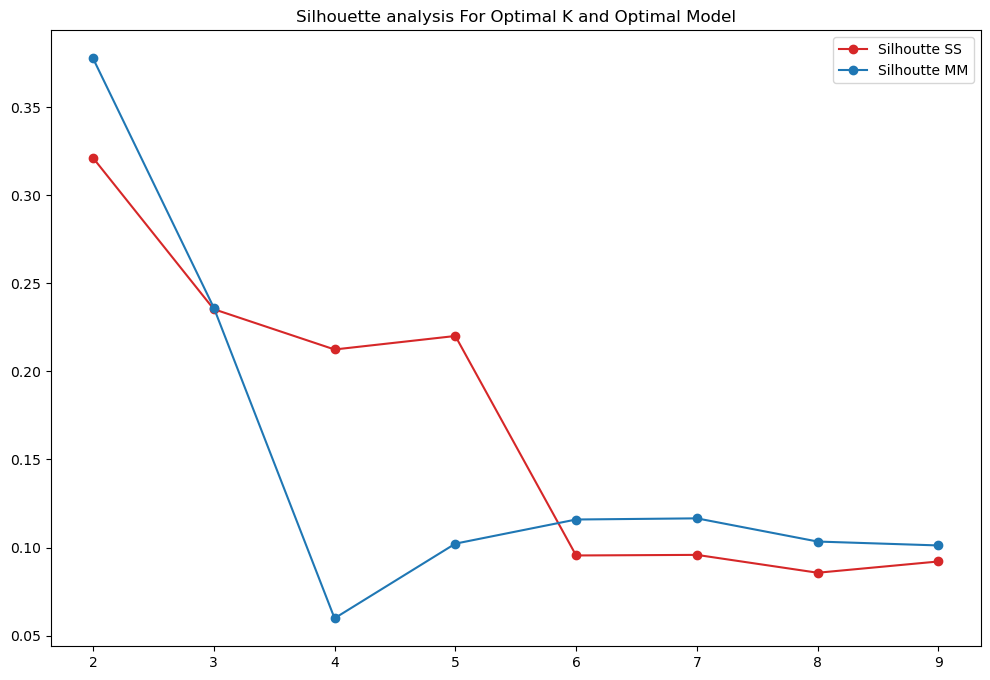

In [327]:
# Experiment number 1.
plt.figure(figsize=(12, 8))
plt.plot(range(2, 10), silhoutte_score_ss, "-o", c="C3")
plt.plot(range(2, 10), silhoutte_score_mm, "-o", c="C0")
plt.title("Silhouette analysis For Optimal K and Optimal Model")
plt.legend(["Silhoutte SS", "Silhoutte MM"]);

In [328]:
# Experiment number 2. (1/2)
silhoutte_score_ss = []

for i in range(2, 10):

    start = time.time()

    km = TimeSeriesKMeans(n_clusters=i, metric="softdtw", max_iter=20, max_iter_barycenter=10, random_state=0)
    y_pred_ss = km.fit_predict(X_ss)
    score_ss = silhouette_score(X_ss, y_pred_ss, metric="softdtw")
    silhoutte_score_ss.append(score_ss)

    stop = time.time()
    duration = stop - start

    print(f"K = {i}.", f"Took {duration:.2f} seconds to calculate.")

K = 2. Took 24.04 seconds to calculate.
K = 3. Took 28.41 seconds to calculate.
K = 4. Took 37.74 seconds to calculate.
K = 5. Took 28.69 seconds to calculate.
K = 6. Took 30.91 seconds to calculate.
K = 7. Took 33.68 seconds to calculate.
K = 8. Took 35.94 seconds to calculate.
K = 9. Took 39.43 seconds to calculate.


In [329]:
# Experiment number 2. (2/2)
silhoutte_score_mm = []

for i in range(2, 10):

    start = time.time()

    km = TimeSeriesKMeans(n_clusters=i, metric="softdtw", max_iter=20, max_iter_barycenter=10, random_state=0)
    y_pred_mm = km.fit_predict(X_mm)
    score_mm = silhouette_score(X_mm, y_pred_mm, metric="softdtw")
    silhoutte_score_mm.append(score_mm)

    stop = time.time()
    duration = stop - start

    print(f"K = {i}.", f"Took {duration:.2f} seconds to calculate.")

K = 2. Took 11.38 seconds to calculate.
K = 3. Took 11.44 seconds to calculate.
K = 4. Took 13.22 seconds to calculate.
K = 5. Took 14.11 seconds to calculate.
K = 6. Took 15.19 seconds to calculate.
K = 7. Took 17.38 seconds to calculate.
K = 8. Took 23.64 seconds to calculate.
K = 9. Took 29.61 seconds to calculate.


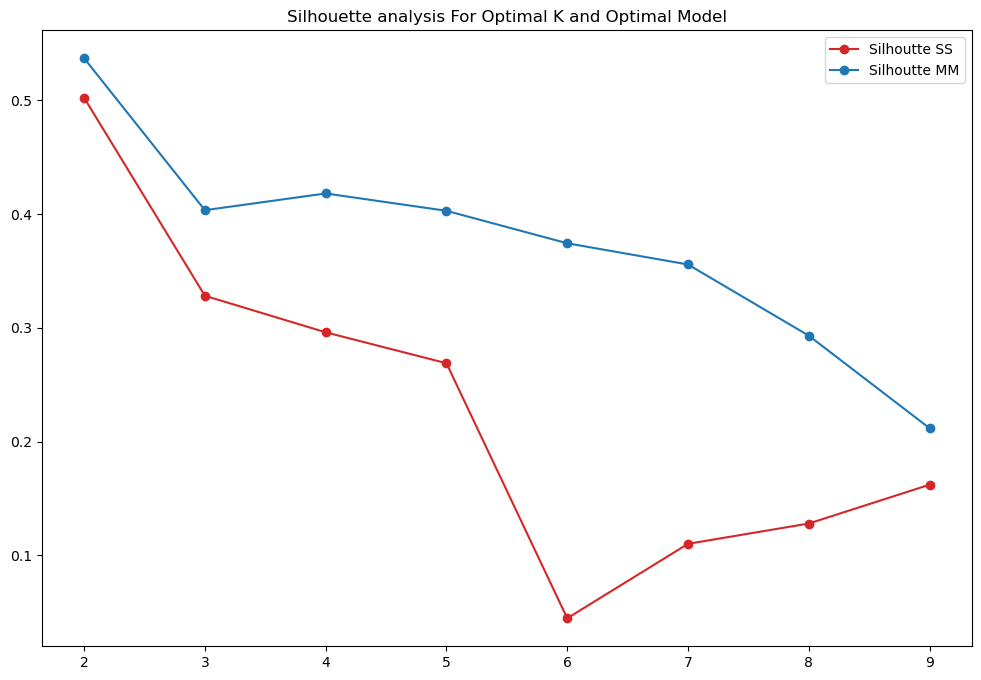

In [330]:
# Experiment number 2.
plt.figure(figsize=(12, 8))
plt.plot(range(2, 10), silhoutte_score_ss, "-o", c="C3")
plt.plot(range(2, 10), silhoutte_score_mm, "-o", c="C0")
plt.title("Silhouette analysis For Optimal K and Optimal Model")
plt.legend(["Silhoutte SS", "Silhoutte MM"]);

In [331]:
# Experiment number 3. (1/2)
silhoutte_score_ss = []

for i in range(2, 10):

    start = time.time()

    km = TimeSeriesKMeans(n_clusters=i, metric="euclidean", max_iter=20, max_iter_barycenter=10, random_state=0)
    y_pred_ss = km.fit_predict(X_ss)
    score_ss = silhouette_score(X_ss, y_pred_ss, metric="euclidean")
    silhoutte_score_ss.append(score_ss)

    stop = time.time()
    duration = stop - start

    print(f"K = {i}.", f"Took {duration:.2f} seconds to calculate.")

K = 2. Took 0.03 seconds to calculate.
K = 3. Took 0.04 seconds to calculate.
K = 4. Took 0.02 seconds to calculate.
K = 5. Took 0.03 seconds to calculate.
K = 6. Took 0.02 seconds to calculate.
K = 7. Took 0.03 seconds to calculate.
K = 8. Took 0.03 seconds to calculate.
K = 9. Took 0.06 seconds to calculate.


In [332]:
# Experiment number 3. (2/2)
silhoutte_score_mm = []

for i in range(2, 10):

    start = time.time()

    km = TimeSeriesKMeans(n_clusters=i, metric="euclidean", max_iter=20, max_iter_barycenter=10, random_state=0)
    y_pred_mm = km.fit_predict(X_mm)
    score_mm = silhouette_score(X_mm, y_pred_mm, metric="euclidean")
    silhoutte_score_mm.append(score_mm)

    stop = time.time()
    duration = stop - start

    print(f"K = {i}.", f"Took {duration:.2f} seconds to calculate.")

K = 2. Took 0.04 seconds to calculate.
K = 3. Took 0.04 seconds to calculate.
K = 4. Took 0.03 seconds to calculate.
K = 5. Took 0.02 seconds to calculate.
K = 6. Took 0.03 seconds to calculate.
K = 7. Took 0.03 seconds to calculate.
K = 8. Took 0.03 seconds to calculate.
K = 9. Took 0.06 seconds to calculate.


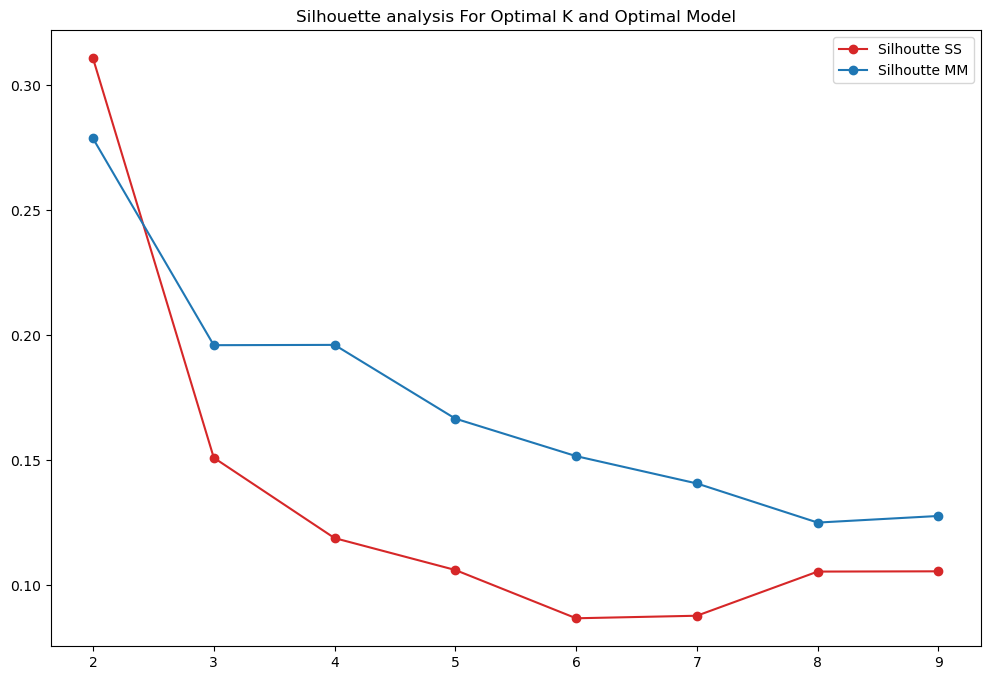

In [333]:
# Experiment number 3.
plt.figure(figsize=(12, 8))
plt.plot(range(2, 10), silhoutte_score_ss, "-o", c="C3")
plt.plot(range(2, 10), silhoutte_score_mm, "-o", c="C0")
plt.title("Silhouette analysis For Optimal K and Optimal Model")
plt.legend(["Silhoutte SS", "Silhoutte MM"]);

Se correra K-means con la tecnica de normalización y los parametros que mas alto tengan el valor de la silueta.

El objetivo es tener una mirada más profunda en los grupos sugeridos por la mejor combinación. <br>
Esto debería permitirnos tener una mejor discusión sobre los resultados de esta implementación. <br>

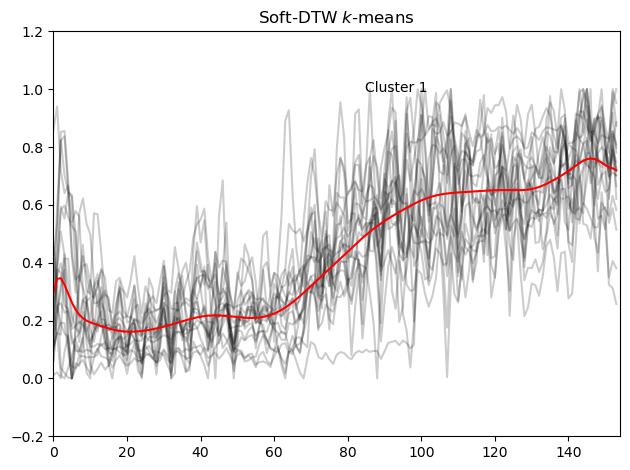

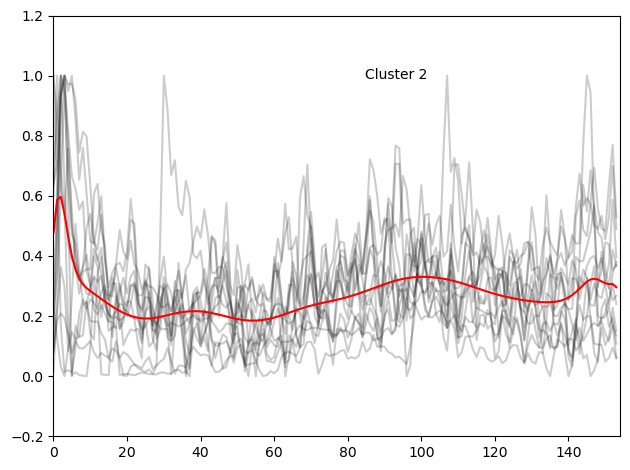

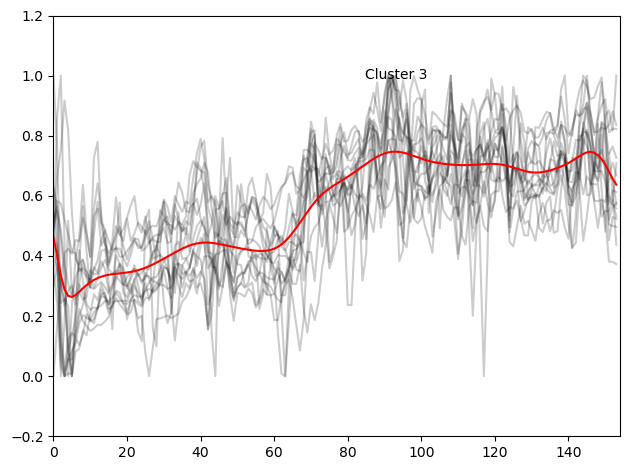

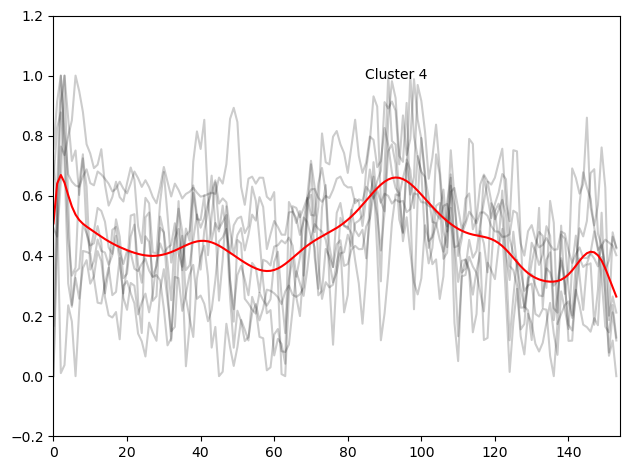

In [359]:
# Based on the Silhoutte Score the best K = 4 , the best metric is , and the best tecnique to normalize is MinMax
km = TimeSeriesKMeans(n_clusters=4, metric="softdtw", max_iter=20, max_iter_barycenter=10, random_state=0)
y_pred_mm = km.fit_predict(X_mm)

for yi in range(len(np.unique(y_pred_mm))):
    for xx in X_mm[y_pred_mm == yi]:
        plt.plot(xx.ravel(), "k-", alpha=.2)
    plt.plot(km.cluster_centers_[yi].ravel(), "r-")
    plt.xlim(0, X_mm.shape[1])
    plt.ylim(-0.2, 1.2)
    plt.text(0.55, 0.85,'Cluster %d' % (yi + 1), transform=plt.gca().transAxes)
    if yi == 0:
        plt.title("Soft-DTW $k$-means")

    plt.tight_layout()
    plt.show();

In [354]:
for i in range(len(np.unique(y_pred_mm))):
    count = (sum(y_pred_mm == i)/len(y_pred_mm))*100
    print(f"The {count:.2f}% of the observations fall into Cluster {i + 1}")

The 33.96% of the observations fall into Cluster 1
The 24.53% of the observations fall into Cluster 2
The 28.30% of the observations fall into Cluster 3
The 13.21% of the observations fall into Cluster 4


In [360]:
y_pred_mm

array([2, 1, 3, 1, 1, 0, 0, 2, 0, 2, 0, 0, 1, 1, 2, 1, 0, 0, 1, 0, 0, 1,
       2, 3, 2, 2, 0, 3, 2, 3, 2, 0, 1, 2, 3, 1, 0, 1, 2, 1, 3, 3, 2, 1,
       0, 0, 2, 0, 0, 0, 2, 0, 2], dtype=int64)

In [361]:
ProductosSeleccionados_mediaMovil_Pred= ProductosSeleccionados_mediaMovil.T.copy()
ProductosSeleccionados_mediaMovil_Pred.head()

,0,1,2,3,4,5,6,7,8,9,...,144,145,146,147,148,149,150,151,152,153
1000031,5022.8505,4681.1305,3077.6035,3152.5875,3032.2150,1852.3485,3030.5045,3964.0420,3445.4895,3061.6655,...,5719.75,5984.625,5747.0,5323.0470,5102.9220,5457.8750,5470.9690,4799.393,4734.3225,4670.2935
1000497,2084.5000,2749.0000,3723.5000,3655.5000,3307.5000,2980.0000,2890.6250,2736.6250,2797.2655,2294.4235,...,2765.00,2824.000,2777.0,2620.5000,2595.0000,2691.3125,2518.8125,2683.000,3057.5000,2594.0000
1000498,819.8330,700.1665,262.6670,283.8335,440.6665,398.1665,254.6670,429.6675,583.3335,580.6665,...,759.00,933.167,698.0,650.3335,704.0005,855.0000,749.8335,402.000,632.1670,590.0005
1000794,5496.5000,5996.0000,7546.0000,7941.0000,6352.0000,4564.0000,3954.0000,3398.5000,3646.5000,4543.0000,...,2135.00,2579.500,2572.5,1967.0000,1946.5000,1940.5000,1565.0000,1653.000,1880.5000,1652.0000
1000812,24.0000,39.0000,54.5000,47.5000,24.5000,44.0000,70.0000,53.5000,42.0000,39.6250,...,98.50,123.000,117.0,71.0000,47.5000,60.0000,48.0000,40.000,52.5000,56.5000


In [362]:
ProductosSeleccionados_mediaMovil_Pred=ProductosSeleccionados_mediaMovil_Pred.reset_index().rename(columns={'index': 'Materiales'})
ProductosSeleccionados_mediaMovil_Pred['Cluster'] = pd.Series(y_pred_mm, dtype=int)
ProductosSeleccionados_mediaMovil_Pred.head()

,Materiales,0,1,2,3,4,5,6,7,8,...,145,146,147,148,149,150,151,152,153,Cluster
0,1000031,5022.8505,4681.1305,3077.6035,3152.5875,3032.2150,1852.3485,3030.5045,3964.0420,3445.4895,...,5984.625,5747.0,5323.0470,5102.9220,5457.8750,5470.9690,4799.393,4734.3225,4670.2935,2
1,1000497,2084.5000,2749.0000,3723.5000,3655.5000,3307.5000,2980.0000,2890.6250,2736.6250,2797.2655,...,2824.000,2777.0,2620.5000,2595.0000,2691.3125,2518.8125,2683.000,3057.5000,2594.0000,1
2,1000498,819.8330,700.1665,262.6670,283.8335,440.6665,398.1665,254.6670,429.6675,583.3335,...,933.167,698.0,650.3335,704.0005,855.0000,749.8335,402.000,632.1670,590.0005,3
3,1000794,5496.5000,5996.0000,7546.0000,7941.0000,6352.0000,4564.0000,3954.0000,3398.5000,3646.5000,...,2579.500,2572.5,1967.0000,1946.5000,1940.5000,1565.0000,1653.000,1880.5000,1652.0000,1
4,1000812,24.0000,39.0000,54.5000,47.5000,24.5000,44.0000,70.0000,53.5000,42.0000,...,123.000,117.0,71.0000,47.5000,60.0000,48.0000,40.000,52.5000,56.5000,1


In [369]:
ProductosSeleccionados_mediaMovil_Pred.to_excel('Materiales_Cluster.xlsx', index=False)

In [364]:
ProductosSeleccionados_mediaMovil_Pred.Materiales[ProductosSeleccionados_mediaMovil_Pred.Cluster==3]

2     1000498
23    1012347
27    1017925
29    1019943
34    1031533
40    1042123
41    1042513
Name: Materiales, dtype: object

<AxesSubplot:>

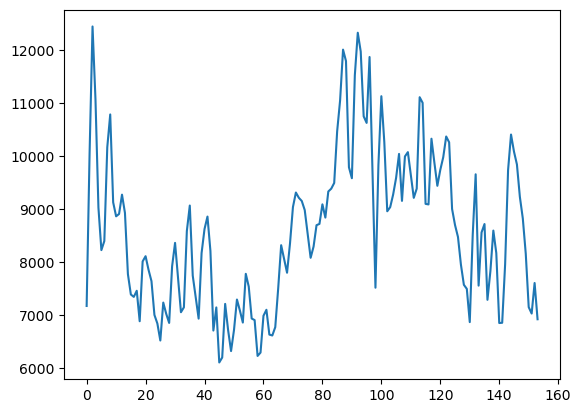

In [367]:
ProductosSeleccionados_mediaMovil['1017925'].plot()

<AxesSubplot:>

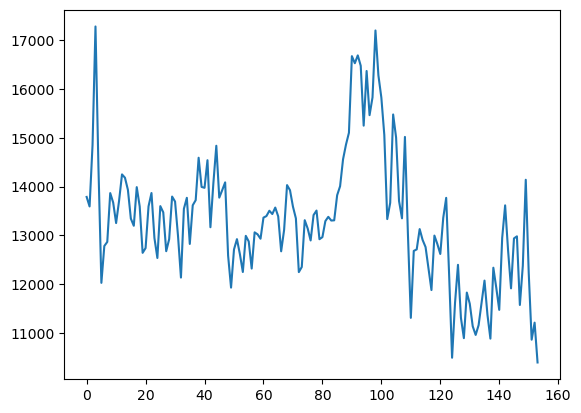

In [368]:
ProductosSeleccionados_mediaMovil['1042513'].plot()